In [1]:
#Paso 1: crear un environment y correr los requirments

In [2]:
from IPython.display import display, HTML

display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }a
</style>
"""))

### ¿Geopandas?

Geopandas enables the use and manipulation of geospatial data in Python. It extends the common datatype used in pandas to allow for the many and unique geometric operations: GeoSeries and GeoDataFrame. Geopandas is also built on top of shapely for its geometric operation; its underlying datatype allows Geopandas to run blazingly fast and is appropriate for many machine learning pipelines that require large geospatial datasets.
Geopandas, a diferencia de un panda, tiene una columna adicional que contiene una GEOMETRÍA -> coordenadas
id     |      var 1    | ..... | geometría
__________________________________________
SJL    |.......................| Conjunto de puntos de SJL

A los lugares los identificamos por latitud y longitud -> 1 punto
Cuando hablamos de geometrías, hacemos referencia a una COLECCIÓN de puntos (una geometría son los bordes)

### Instalation 

Following steps:

#### 1. create new environment

conda creare -name new_env

#### 2. Activate new environment
conda activate new_env

#### 3. Install package 

conda install -c conda-forge python=3 geopandas

### Geopandas data types

Shapefile (.shp): vector data that stores geospatial information such as topology, shape geometry, coordinate etc

GeoJSON (.geojson): geospatial information and relevant characteristics (object or string)

Finally, Geopandas creates an additional geometry column


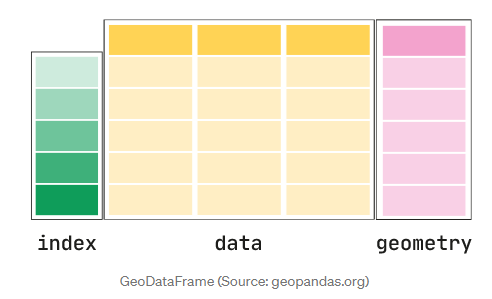


### Coordinate Reference Systems (crs)

The coordinate reference systems tell us how GeodataFrame o GeoSeries relate to places on Earth
SIEMPRE QUE TRABAJEMOS CON SHAPEFILES, tenemos que crear un CRS
* Siempre que trabajemos, tenemos que asegurarnos que la data geospecial que tenemos esté proyectado en el sistema WGS-84 (el que usamos para leer lat-long)
* Para setear que la data esté correctamente ubicada, seteamos el crs a WGS-84 (hay otras formas, pero queremos que esté proyectado en latitud y longitud).

#### relevant operations: setting a projection and re-projecting 

setting projection: geopandas.read_file() most of time includes projection information. Check using "Geoseries.crs"
If GeoDataframe does not include projection, hence use data["geometry"].set_crs(epsg=4326) for WGS-84.

### WGS-84: 
The Global Positioning System uses the World Geodetic System (WGS84) as its reference coordinate system. It's made up of a reference ellipsoid, a standard coordinate system, altitude data, and a geoid

### Reprojecting:

In somes cases, due to distortions in bidimensional plane and your application of geospatial data, re-projection is required. 

A commonly used default is Universal Transverse Mercator (UTM)







In [5]:
#Cuando jalemos data de otros países, puede que tenga caracteres que no reconocemos. Esta librería nos ayudará con esto:
!pip install chardet

In [6]:
import pandas as pd
from pandas import Series, DataFrame
import numpy as np
import matplotlib.pyplot as plt 
import chardet

In [7]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [9]:
import geopandas as gpd
from geopandas import GeoSeries
from shapely.geometry import Point, LineString
import folium 
from folium import Marker, GeoJson
from folium.plugins import MarkerCluster, HeatMap

In [10]:
# Gettting the character format (encoding type)
#Leemos la base de datos y pedimos que nos diga el tipo de  codificación de esta base.
#utf-8: lee caracteres en español
#De esta manera, cuando leamos la data con read pandas, le diremos que el encoding es charenc = det['encoding']

base = open(r'../_data/Datos_panel_distritos.csv', 'rb').read()
det = chardet.detect(base)
charenc = det['encoding']
charenc

'utf-8'

## Covid Data

In [11]:
#Data a nivel distrital mensual sobre covid desde marzo 2020

# Import csv file from panel covid information at distric level
# Panel data from march-2020 to first two wees of january-2022

cv_data = pd.read_csv( r'../_data/Datos_panel_distritos.csv', encoding = charenc)
cv_data.head( 5 )

,Código,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
0,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,3,2020,0,0,16
1,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,4,2020,47,0,5
2,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,5,2020,165,3,11
3,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,6,2020,119,2,15
4,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,7,2020,175,2,8


In [12]:
#Paso 1: quiero ver qué tipos de variables tiene
cv_data.dtypes

Código              int64
Departamento       object
Provincia          object
Distrito           object
Mes                 int64
Año                 int64
Casos               int64
Muertes Covid       int64
Muertes totales     int64
dtype: object

In [13]:
#Paso 2: dentro de la base de datos cambiaré el nombre de la columna Código por Ubigeo
# rename variable to merge later 
cv_data = cv_data.rename({'Código':'UBIGEO'}, axis =1 )
cv_data.head( 5 )

,UBIGEO,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
0,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,3,2020,0,0,16
1,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,4,2020,47,0,5
2,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,5,2020,165,3,11
3,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,6,2020,119,2,15
4,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,7,2020,175,2,8


In [14]:
#Casi siempre nos enfrentamos al siguiente problema. 
#Usualmente recibiremos una data que contiene métricas
# id | Métrica_1 | ..... |
# Para plotear este mapa, necesitamos información de los polígonos de cada distrito (geopandas)
# id | .... | Geometry | 
#En la BdD1 tenemos métricas y en la BdD 2 tenemos las geometrías -> objetivo final: colorear a SJL dependiendo de lo que tenga en la BdD1
#Para univer ambas, usamos el id

#Se sacan de https://data.humdata.org/
#AD2 son todos los distritos

#AHORA, LA MAYORÍA DE PERSONAS NO USAN SHAPEFILES SINo GEOJSON -> solo leemos los geojson en lugar de los shapefiles, pero el resultado es el mismo
#OJITO: UN shapefile no es nada sin el conjunto de sus archhivos complementarios en una misma carpeta


## Shape File

In [15]:
# Upload shape file at district level

maps = gpd.read_file(r'../_data/shape_file/DISTRITOS.shp')

In [16]:
maps

,IDDPTO,DEPARTAMEN,IDPROV,PROVINCIA,IDDIST,DISTRITO,CAPITAL,CODCCPP,AREA,FUENTE,geometry
0,10,HUANUCO,1009,PUERTO INCA,100902,CODO DEL POZUZO,CODO DEL POZUZO,0001,1,INEI,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975..."
1,10,HUANUCO,1009,PUERTO INCA,100904,TOURNAVISTA,TOURNAVISTA,0001,1,INEI,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,25,UCAYALI,2503,PADRE ABAD,250305,ALEXANDER VON HUMBOLDT,ALEXANDER VON HUMBOLDT,0001,1,INEI,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,25,UCAYALI,2503,PADRE ABAD,250302,IRAZOLA,SAN ALEJANDRO,0001,1,INEI,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,25,UCAYALI,2503,PADRE ABAD,250304,NESHUYA,MONTE ALEGRE,0001,1,INEI,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...,...,...,...,...,...,...,...,...,...
1868,10,HUANUCO,1006,LEONCIO PRADO,100608,CASTILLO GRANDE,CASTILLO GRANDE,0001,1,INEI,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1869,10,HUANUCO,1006,LEONCIO PRADO,100609,PUEBLO NUEVO,PUEBLO NUEVO,0001,1,INEI,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1870,10,HUANUCO,1006,LEONCIO PRADO,100610,SANTO DOMINGO DE ANDA,PACAE,0001,1,INEI,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1871,21,PUNO,2111,SAN ROMAN,211105,SAN MIGUEL,SAN MIGUEL,0001,1,INEI,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


In [17]:
# Tengo una columan de geometrías (compuesta por una selección de puntos)

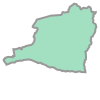

In [18]:
# Plot 1 district (its a collection of points)
#Pidro graficar la colección de puntos del id=1872 (Huaura)
maps["geometry"][1872]

In [19]:
## Set of points for first district
#Pido que me saque las coordenadas de todos los puntos que conforman la geometría de Huaura (x latitud, y longitud)
maps.geometry[1872].boundary.coords.xy

(array('d', [-77.37630123699995, -77.37604411199999, -77.37473998699988, -77.37356623699998, -77.37215023699997, -77.3706952369999, -77.36967261199993, -77.36794211099993, -77.36601486099988, -77.36385173699989, -77.36164923599989, -77.36015473699996, -77.35838498699991, -77.35712636099998, -77.3561037369999, -77.35445186099992, -77.35331136199994, -77.35248536199992, -77.35247111099989, -77.35150211199993, -77.35071561199993, -77.34992898699988, -77.34831648699998, -77.34662511099998, -77.34560261099995, -77.34458011099997, -77.34405761199992, -77.34367548699998, -77.34273161199997, -77.3420629869999, -77.34143373599989, -77.34115698599999, -77.34092236199996, -77.34080436199997, -77.34005711199995, -77.33848398599997, -77.33756798699994, -77.33663548699997, -77.33447223699994, -77.33309573599985, -77.33128661199999, -77.3299793619999, -77.32967398699998, -77.32786486199996, -77.32631636099995, -77.32664448599996, -77.32740823599988, -77.32899286199984, -77.33084911199995, -77.3323712

In [20]:
type(maps.geometry)

geopandas.geoseries.GeoSeries

In [21]:
# Antes de unirlas, debo chequear que en ambas BdD tenga ID únicos

In [22]:
#Check unique values

maps['IDDIST'].is_unique

True

In [23]:
maps['IDDIST'].unique().size

1873

In [24]:
# Select only relevant columns
#Me quedaré solo con las 2 columnas que necesito de esta BdD y renombro ID por UBIGEO, para que esté uniforme y poder unirlo con el cambio que hicimos en la BdD1
maps = maps[['IDDIST', 'geometry']]
maps = maps.rename({'IDDIST':'UBIGEO'}, axis =1 )
maps

,UBIGEO,geometry
0,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975..."
1,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...
1868,100608,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1869,100609,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1870,100610,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1871,211105,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


In [25]:
maps.dtypes

UBIGEO        object
geometry    geometry
dtype: object

In [26]:
# Object or srting to int
#La convierto a STRING y luego a ENTERO 

maps['UBIGEO'] = maps['UBIGEO'].astype(str).astype(int)
maps

,UBIGEO,geometry
0,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975..."
1,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...
1868,100608,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1869,100609,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1870,100610,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1871,211105,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


In [27]:
#  WGS-84 (longitud-latitud projection) 
# TENGO QUE ASEGURARME DE QUE ESTÉ PLOTEADO EN EL SISTEMA WGS-84(EPSG:4326)
maps = maps.to_crs(epsg=4326)
maps.crs

#system of coordenates: CRS (due to where we are)
# vemos que Name: WGS 84 -> cumple
# NUNCA OLVIDEMOS ESTA LÍNEA

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

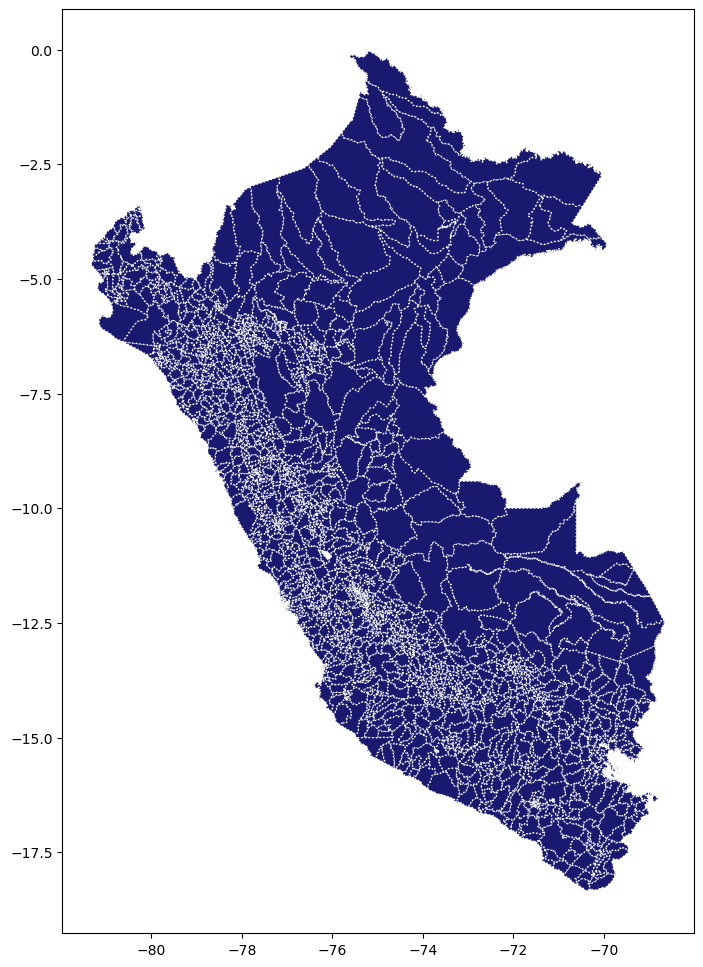

In [28]:
#Siempre que usemos CRS, tenemos que hacer un plot para verificar que que la data que tenemos enel mapa es la que necesitamos
# Plot using geopandas

#figure and axis - ARMO MI PLOTEO DE FIGURAS
fig, ax = plt.subplots(figsize=(12, 12))

#PLOTEO
maps.plot(  ax=ax, color='midnightblue', linestyle='dotted',
            edgecolor='white' )
plt.show()

## Merge: Covid Data & Shapefile

In [29]:
# Unimos las bases de datos
dataset_cv = pd.merge(maps, cv_data, how="inner", on="UBIGEO")
dataset_cv

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
0,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,3,2020,0,0,3
1,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,4,2020,0,1,2
2,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,5,2020,1,0,2
3,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,6,2020,7,0,1
4,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,7,2020,11,1,4
...,...,...,...,...,...,...,...,...,...,...
40360,150806,"POLYGON ((-77.3763 -10.89734, -77.37604 -10.89...",LIMA,HUAURA,HUAURA,9,2021,9,0,20
40361,150806,"POLYGON ((-77.3763 -10.89734, -77.37604 -10.89...",LIMA,HUAURA,HUAURA,10,2021,11,2,16
40362,150806,"POLYGON ((-77.3763 -10.89734, -77.37604 -10.89...",LIMA,HUAURA,HUAURA,11,2021,28,1,10
40363,150806,"POLYGON ((-77.3763 -10.89734, -77.37604 -10.89...",LIMA,HUAURA,HUAURA,12,2021,75,1,16


In [30]:
#BALANCEO LA DATA: PARA CADA DISSTRITO DEBO TENER UN DATO PARA CADA MES. SI NO TIENE INFO, LLENAMOS CON NaN

import pandas as pd
import numpy as np

# Step 1: Get all unique UBIGEOs
ubigeos = dataset_cv['UBIGEO'].unique()

# Step 2: Create all combinations of UBIGEO, Año, Mes
years = dataset_cv['Año'].unique()
months = np.arange(1, 13)  # 1 to 12

full_index = pd.MultiIndex.from_product(
    [ubigeos, years, months],
    names=["UBIGEO", "Año", "Mes"]
)

# Step 3: Set index on the original data for merging
dataset_cv_balanced = dataset_cv.set_index(["UBIGEO", "Año", "Mes"])

# Step 4: Reindex to create balanced panel
dataset_cv_balanced = dataset_cv_balanced.reindex(full_index).reset_index()

# Step 5: Fill missing numeric columns with 0 or NaN
numeric_cols = ["Casos", "Muertes Covid", "Muertes totales"]
dataset_cv_balanced[numeric_cols] = dataset_cv_balanced[numeric_cols].fillna("nan")

# Optional: Forward fill Departamento, Provincia, Distrito, etc.
location_cols = ["Departamento", "Provincia", "Distrito", "geometry"]
dataset_cv_balanced = dataset_cv_balanced.sort_values(["UBIGEO", "Año", "Mes"])
dataset_cv_balanced[location_cols] = dataset_cv_balanced.groupby("UBIGEO")[location_cols].ffill()

dataset_cv_balanced

,UBIGEO,Año,Mes,geometry,Departamento,Provincia,Distrito,Casos,Muertes Covid,Muertes totales
19188,10101,2020,1,None,NaN,NaN,NaN,nan,nan,nan
19189,10101,2020,2,None,NaN,NaN,NaN,nan,nan,nan
19190,10101,2020,3,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,0.0,0.0,16.0
19191,10101,2020,4,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,47.0,0.0,5.0
19192,10101,2020,5,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,165.0,3.0,11.0
...,...,...,...,...,...,...,...,...,...,...
48307,250401,2022,8,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan
48308,250401,2022,9,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan
48309,250401,2022,10,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan
48310,250401,2022,11,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan


In [31]:
#Llenamos la data con la información que sí podemos imputar (nombre del departamento, etc)
# Check if there are missing values in the location columns
missing_locations = dataset_cv_balanced[location_cols].isna().any(axis=1).sum()
print(f"Rows with missing location data: {missing_locations}")

# Fill missing location data by UBIGEO (district identifier)
# Sort by UBIGEO, Year, and Month to ensure proper forward and backward filling
dataset_cv_balanced = dataset_cv_balanced.sort_values(["UBIGEO", "Año", "Mes"])

# First, try forward fill within each UBIGEO group
dataset_cv_balanced[location_cols] = dataset_cv_balanced.groupby("UBIGEO")[location_cols].ffill()

# Then backward fill to handle cases where the first entries might be NaN
dataset_cv_balanced[location_cols] = dataset_cv_balanced.groupby("UBIGEO")[location_cols].bfill()

# Check if there are still missing values after filling
still_missing = dataset_cv_balanced[location_cols].isna().any(axis=1).sum()
print(f"Rows with missing location data after filling: {still_missing}")

# If there are still missing values, we can try to fill them from the maps DataFrame
if still_missing > 0:
    # Only keep the geometry from maps dataframe
    geometry_only = maps[['UBIGEO', 'geometry']].set_index('UBIGEO')
    
    # Fill missing geometries
    missing_geometry = dataset_cv_balanced['geometry'].isna()
    if missing_geometry.any():
        dataset_cv_balanced.loc[missing_geometry, 'geometry'] = dataset_cv_balanced.loc[missing_geometry, 'UBIGEO'].map(geometry_only['geometry'])
    
    # For other location columns, we need to get the information from dataset_cv
    for col in ['Departamento', 'Provincia', 'Distrito']:
        if dataset_cv_balanced[col].isna().any():
            # Create a mapping from UBIGEO to the column
            col_mapping = dataset_cv.drop_duplicates('UBIGEO').set_index('UBIGEO')[col]
            # Apply the mapping to fill missing values
            dataset_cv_balanced.loc[dataset_cv_balanced[col].isna(), col] = dataset_cv_balanced.loc[dataset_cv_balanced[col].isna(), 'UBIGEO'].map(col_mapping)

# Print final status
final_missing = dataset_cv_balanced[location_cols].isna().any(axis=1).sum()
print(f"Rows with missing location data after all filling operations: {final_missing}")

# Show sample of the balanced panel
dataset_cv_balanced

Rows with missing location data: 3510
Rows with missing location data after filling: 0
Rows with missing location data after all filling operations: 0


,UBIGEO,Año,Mes,geometry,Departamento,Provincia,Distrito,Casos,Muertes Covid,Muertes totales
19188,10101,2020,1,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,nan,nan,nan
19189,10101,2020,2,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,nan,nan,nan
19190,10101,2020,3,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,0.0,0.0,16.0
19191,10101,2020,4,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,47.0,0.0,5.0
19192,10101,2020,5,"POLYGON ((-77.88323 -6.17846, -77.88071 -6.179...",AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,165.0,3.0,11.0
...,...,...,...,...,...,...,...,...,...,...
48307,250401,2022,8,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan
48308,250401,2022,9,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan
48309,250401,2022,10,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan
48310,250401,2022,11,"POLYGON ((-70.50719 -9.42663, -70.50693 -9.426...",UCAYALI,PURUS,PURUS,nan,nan,nan


In [32]:
#Con esta función, elegimos si queremos plotear todo el Perú o quiero hacer alguna restricción a solo un distrito, además si queremos
# a partir del año o del mes:

# Function to filter dataset_covid by year, month and administrative space(province)

def subdata( a , b, c ):
    
    if c == "All-Peru":
        
        resultado = dataset_cv.loc[(dataset_cv['Año']== a) & (dataset_cv['Mes']== b)]
    else:
        resultado = dataset_cv.loc[(dataset_cv['Año']== a) & (dataset_cv['Mes']== b) & (dataset_cv['Provincia']== c)]
    return resultado  


In [36]:
#base.Provincia.unique()

In [132]:
#Con la función anterior, puedo crear estas bases:

#Second wave 
base = subdata( 2020 , 8, "All-Peru")  # all peru Aug-2020

#Second wave only Lima
base_lima = subdata( 2020 , 8, "LIMA")  # Lima Aug-2020

#Second wave only Lima
base_ayacucho = subdata( 2020 , 10, "LUCANAS")  # Lima Aug-2020

In [133]:
base_ayacucho
#me quedo solo con lucanas, en el mes 8 del 2020.
#Si quiero coger un conjunto de distritos, puedo modificar las funciones para que seleccione una lista

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
24617,50618,"POLYGON ((-74.45485 -14.15098, -74.45421 -14.1...",AYACUCHO,LUCANAS,SAN PEDRO DE PALCO,10,2020,0,0,0
37773,50617,"POLYGON ((-74.12341 -14.73414, -74.12249 -14.7...",AYACUCHO,LUCANAS,SAN PEDRO,10,2020,1,0,0
37819,50621,"POLYGON ((-74.39258 -14.72377, -74.39211 -14.7...",AYACUCHO,LUCANAS,SANTA LUCIA,10,2020,0,0,0
37842,50615,"POLYGON ((-74.28449 -14.69725, -74.28211 -14.6...",AYACUCHO,LUCANAS,SAN CRISTOBAL,10,2020,2,0,0
37957,50619,"POLYGON ((-74.04573 -14.91, -74.04615 -14.9127...",AYACUCHO,LUCANAS,SANCOS,10,2020,6,0,0
38003,50614,"POLYGON ((-74.36156 -14.77078, -74.35963 -14.7...",AYACUCHO,LUCANAS,SAISA,10,2020,0,0,0
38026,50605,"POLYGON ((-73.8766 -14.80292, -73.87742 -14.80...",AYACUCHO,LUCANAS,CHAVI<d1>A,10,2020,0,0,2
38049,50616,"POLYGON ((-74.17274 -14.59704, -74.17246 -14.5...",AYACUCHO,LUCANAS,SAN JUAN,10,2020,0,0,0
38417,50609,"POLYGON ((-74.43725 -14.52504, -74.43454 -14.5...",AYACUCHO,LUCANAS,LEONCIO PRADO,10,2020,1,0,0
38440,50606,"POLYGON ((-73.85391 -14.2781, -73.85018 -14.28...",AYACUCHO,LUCANAS,CHIPAO,10,2020,2,0,1


In [134]:
base

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
5,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,8,2020,110,3,5
28,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828...",HUANUCO,PUERTO INCA,TOURNAVISTA,8,2020,33,0,1
51,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742...",UCAYALI,PADRE ABAD,ALEXANDER VON HUMBOLDT,8,2020,3,2,1
74,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569...",UCAYALI,PADRE ABAD,IRAZOLA,8,2020,48,2,4
97,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446...",UCAYALI,PADRE ABAD,NESHUYA,8,2020,53,2,3
...,...,...,...,...,...,...,...,...,...,...
40255,100608,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130...",HUANUCO,LEONCIO PRADO,CASTILLO GRANDE,8,2020,160,5,4
40278,100609,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010...",HUANUCO,LEONCIO PRADO,PUEBLO NUEVO,8,2020,4,2,2
40301,100610,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886...",HUANUCO,LEONCIO PRADO,SANTO DOMINGO DE ANDA,8,2020,13,0,0
40324,211105,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3...",PUNO,SAN ROMAN,SAN MIGUEL,8,2020,100,9,30


In [ ]:
#Antes de plotear cualquier variable, procuremos ver la distribución:

In [36]:
#fig, ax = plt.subplots(figsize=(20, 20))

#base.plot(  ax=ax, color='red', linestyle='dotted',
#            edgecolor='black' )
#plt.show()

#does not picture the provinces who dont have covid cases.

In [37]:
# Plot without axis

#fig, ax = plt.subplots(figsize=(20, 20))
#base.plot(ax=ax,color='blue', linestyle='-',
#                      edgecolor='black')
#ax.set_axis_off()

IndentationError: unexpected indent (1816491905.py, line 5)

## Plot covid infection at disctrict level 

<Axes: >

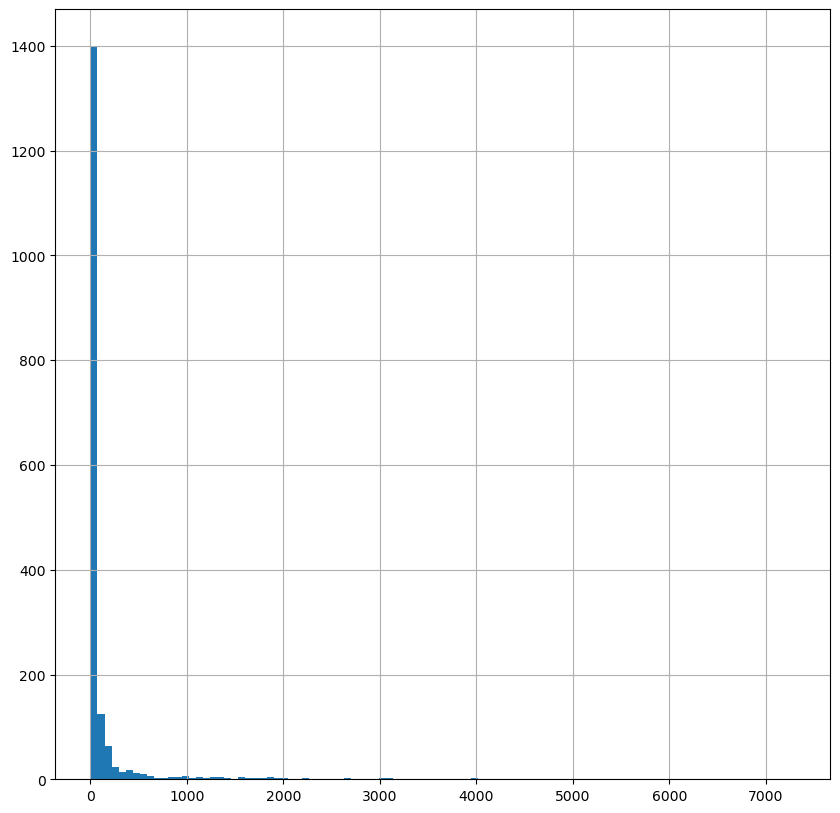

In [135]:
# First always check the distribution
fig, ax = plt.subplots(figsize=(10, 10))
base["Casos"].hist(bins = 100)

#check the distribution of the variables BEFORE PLOTTING -> para identificar los outlyers
#Vemos que un montón de distritos tienen 0

In [136]:
base
#Plotearemos esta base que tiene informaci´pon del ubigeo, distrito y mes (agosto 2020)

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
5,100902,"POLYGON ((-75.31797 -9.29529, -75.3171 -9.2975...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,8,2020,110,3,5
28,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828...",HUANUCO,PUERTO INCA,TOURNAVISTA,8,2020,33,0,1
51,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742...",UCAYALI,PADRE ABAD,ALEXANDER VON HUMBOLDT,8,2020,3,2,1
74,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569...",UCAYALI,PADRE ABAD,IRAZOLA,8,2020,48,2,4
97,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446...",UCAYALI,PADRE ABAD,NESHUYA,8,2020,53,2,3
...,...,...,...,...,...,...,...,...,...,...
40255,100608,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130...",HUANUCO,LEONCIO PRADO,CASTILLO GRANDE,8,2020,160,5,4
40278,100609,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010...",HUANUCO,LEONCIO PRADO,PUEBLO NUEVO,8,2020,4,2,2
40301,100610,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886...",HUANUCO,LEONCIO PRADO,SANTO DOMINGO DE ANDA,8,2020,13,0,0
40324,211105,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3...",PUNO,SAN ROMAN,SAN MIGUEL,8,2020,100,9,30


<Axes: >

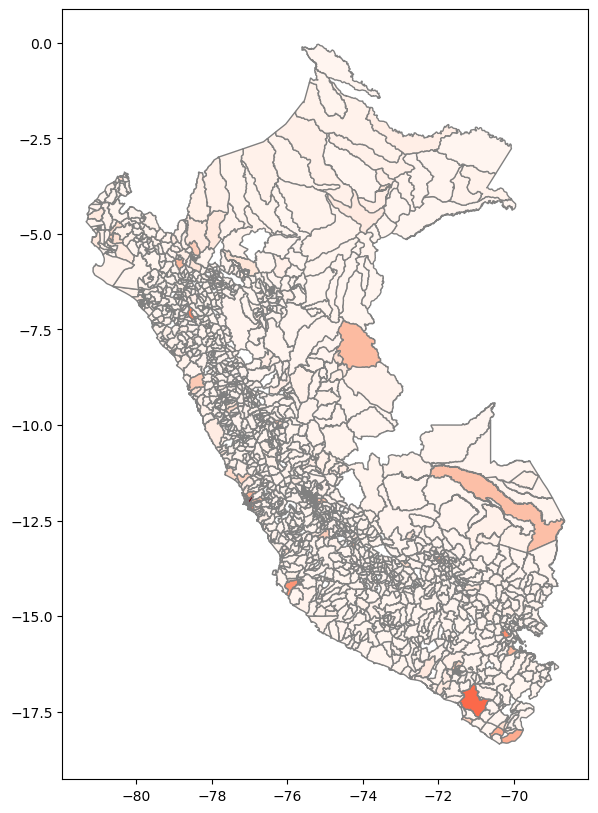

In [137]:
# Plot covid infection at disctrict level 
#Voy a elegir la columna que quiero plotear. Para el color map, le colocaré rojo
base.plot( column='Casos', cmap='Reds', 
          figsize=(10, 10),
          linestyle='-',
          edgecolor='gray',)

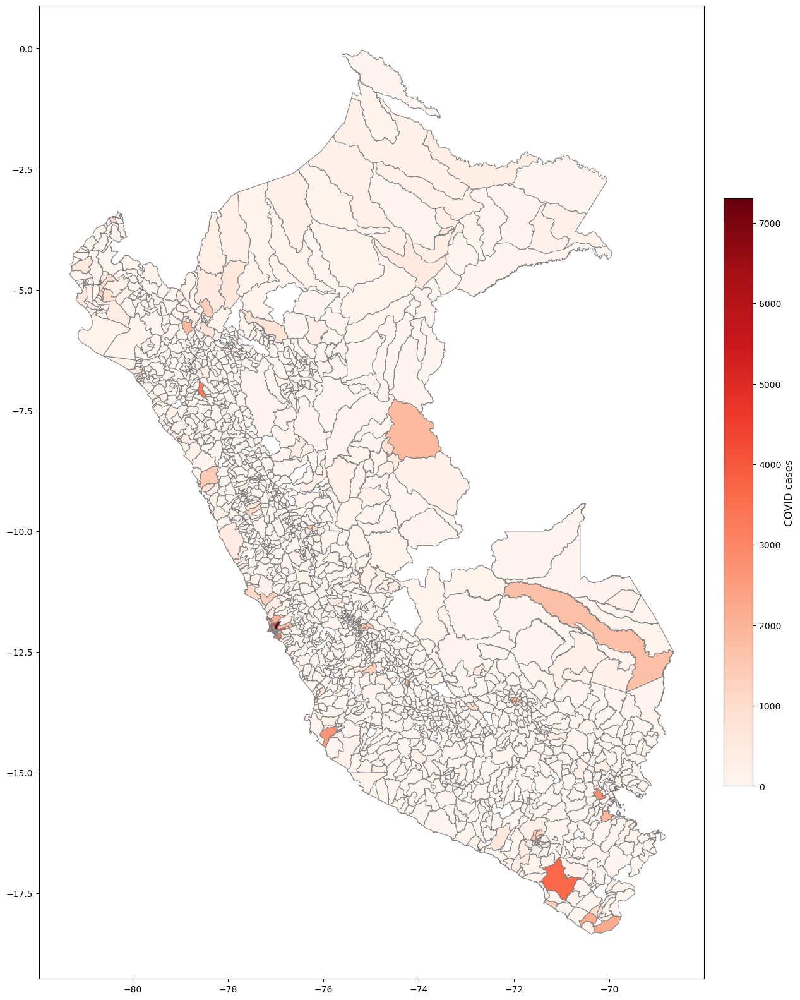

In [45]:
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(figsize=(20, 20))

# Plot without legend so we can control the colorbar
base.plot(
    column='Casos',
    cmap='Reds',
    linewidth=0.8,
    ax=ax,
    edgecolor='gray'
)

# Create a ScalarMappable for continuous colorbar
sm = plt.cm.ScalarMappable(
    cmap='Reds',
    norm=plt.Normalize(vmin=base['Casos'].min(), vmax=base['Casos'].max())
)
sm._A = []  # dummy array for ScalarMappable

# Add continuous colorbar
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("COVID cases", fontsize=12)


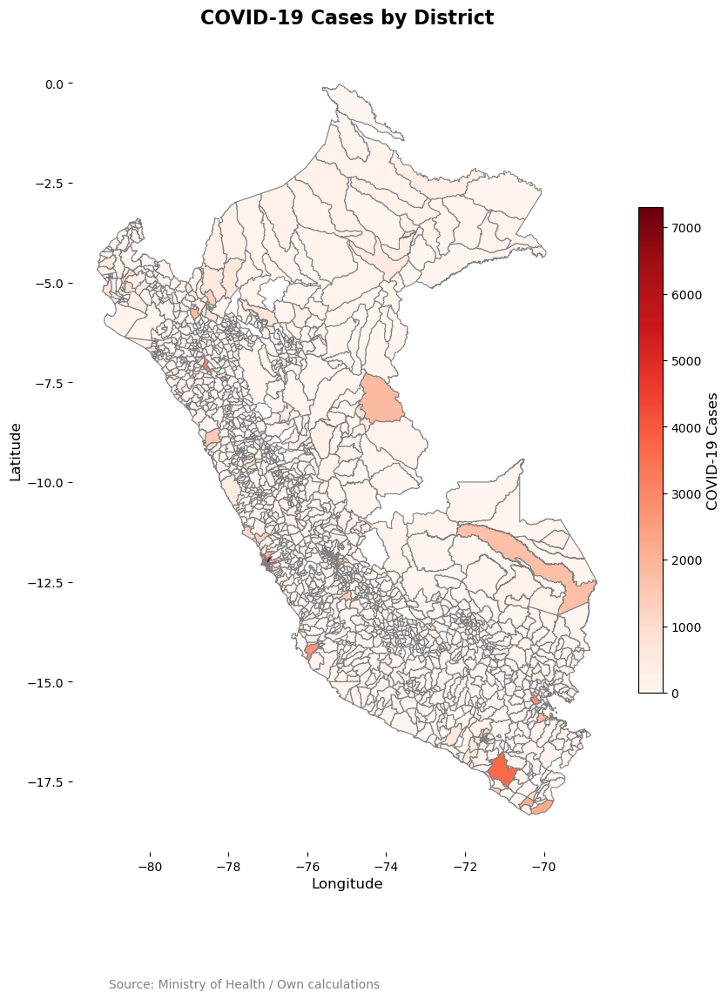

In [149]:
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(figsize=(12, 12))

# Plot the map
base.plot(
    column='Casos',
    cmap='Reds',
    linewidth=0.8,
    ax=ax,
    edgecolor='gray'
)

# Continuous colorbar
sm = plt.cm.ScalarMappable(
    cmap='Reds',
    norm=plt.Normalize(vmin=base['Casos'].min(), vmax=base['Casos'].max())
)
sm._A = []
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("COVID-19 Cases", fontsize=12)

# Add title
ax.set_title("COVID-19 Cases by District", fontsize=16, fontweight='bold', pad=20)

# Axis labels
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# Source note at the bottom
fig.text(
    0.5, -0.02, "Source: Ministry of Health / Own calculations",
    ha="center", fontsize=10, color="gray"
)

# Remove axis spines for a cleaner map
for spine in ax.spines.values():
    spine.set_visible(False)

plt.show()


C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\1022717772.py:55: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc="lower left")
C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\1022717772.py:55: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="lower left")


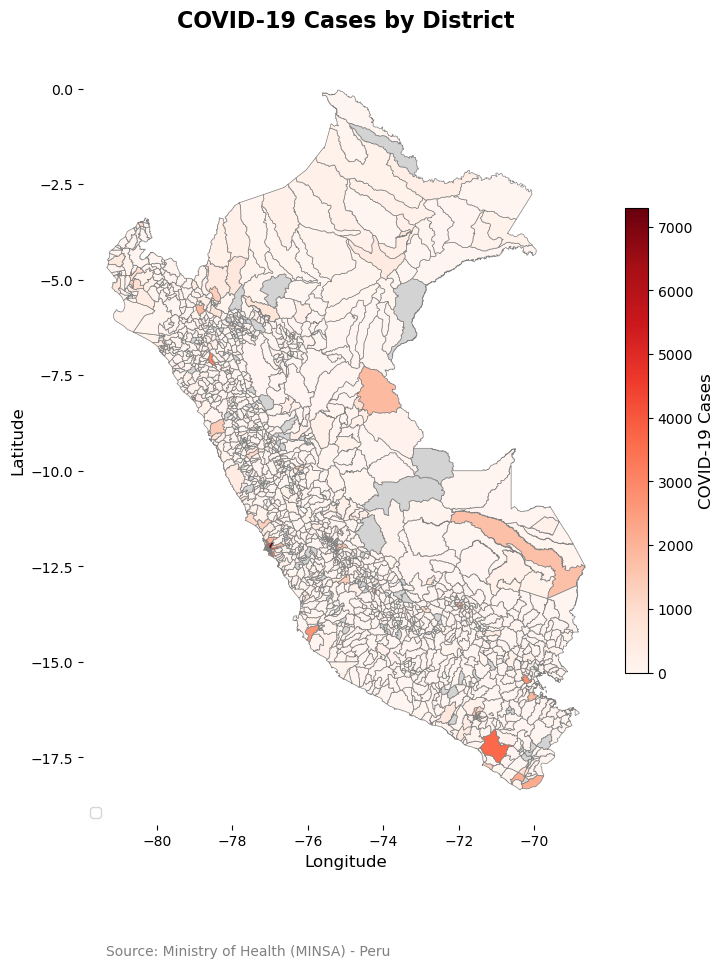

In [150]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd

# Merge all districts (maps) with the covid data (base)
# Assuming both have a common key, e.g. 'UBIGEO'
merged = maps.merge(base[['UBIGEO', 'Casos']],
                    on='UBIGEO', how='left')

fig, ax = plt.subplots(figsize=(10, 10))

# Plot all polygons (merged)
merged.plot(
    column='Casos',
    cmap='Reds',
    linewidth=0.5,
    ax=ax,
    edgecolor='gray',
    missing_kwds={
        "color": "lightgray",    # fill for missing data
        "edgecolor": "gray",
        "label": "No data"
    }
)

# Continuous colorbar
sm = plt.cm.ScalarMappable(
    cmap='Reds',
    norm=plt.Normalize(vmin=merged['Casos'].min(skipna=True),
                       vmax=merged['Casos'].max(skipna=True))
)
sm._A = []
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("COVID-19 Cases", fontsize=12)

# Title
ax.set_title("COVID-19 Cases by District",
             fontsize=16, fontweight='bold', pad=20)

# Axis labels
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# Source note
fig.text(
    0.5, -0.02, "Source: Ministry of Health (MINSA) - Peru",
    ha="center", fontsize=10, color="gray"
)

# Remove axis spines
for spine in ax.spines.values():
    spine.set_visible(False)

# Add legend for missing data
ax.legend(loc="lower left")

plt.show()


In [138]:
base_lima

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
8147,150119,"POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...",LIMA,LIMA,LURIN,8,2020,452,29,68
9090,150102,"POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...",LIMA,LIMA,ANCON,8,2020,460,30,51
11689,150131,"POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...",LIMA,LIMA,SAN ISIDRO,8,2020,551,30,86
11712,150120,"POLYGON ((-77.0721 -12.08358, -77.06348 -12.08...",LIMA,LIMA,MAGDALENA DEL MAR,8,2020,478,49,94
11735,150130,"POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...",LIMA,LIMA,SAN BORJA,8,2020,1012,54,123
11758,150116,"POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...",LIMA,LIMA,LINCE,8,2020,855,76,129
11781,150140,"POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...",LIMA,LIMA,SANTIAGO DE SURCO,8,2020,2628,171,394
11850,150121,"POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...",LIMA,LIMA,PUEBLO LIBRE,8,2020,633,61,140
12379,150139,"POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...",LIMA,LIMA,SANTA ROSA,8,2020,114,9,15
15047,150106,"POLYGON ((-76.89995 -11.72979, -76.89921 -11.7...",LIMA,LIMA,CARABAYLLO,8,2020,2054,183,281


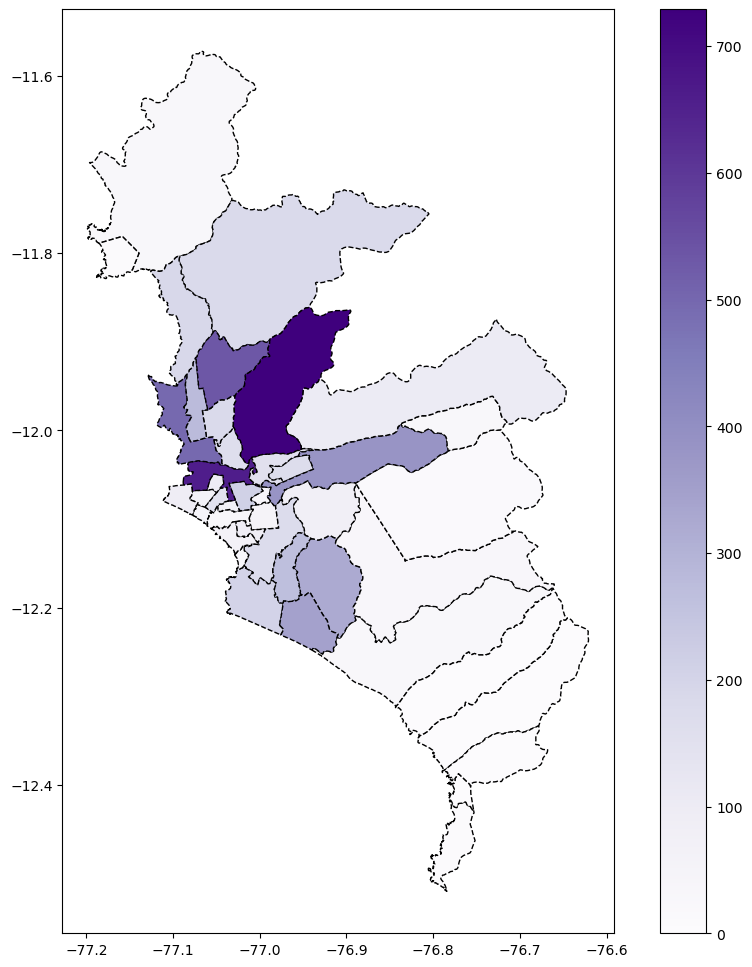

In [140]:
#Si me quiero centrar solo en Lima
#OJITO: las variables puede ser discreta
# Covid & Lima Matropolitana 

base_lima.plot(column='Muertes Covid', cmap='Purples', figsize=(12, 12), linestyle='--',
                      edgecolor='black', 
                      legend = True)

# save map
plt.savefig(r'Lima_covid_Heatmap.png')

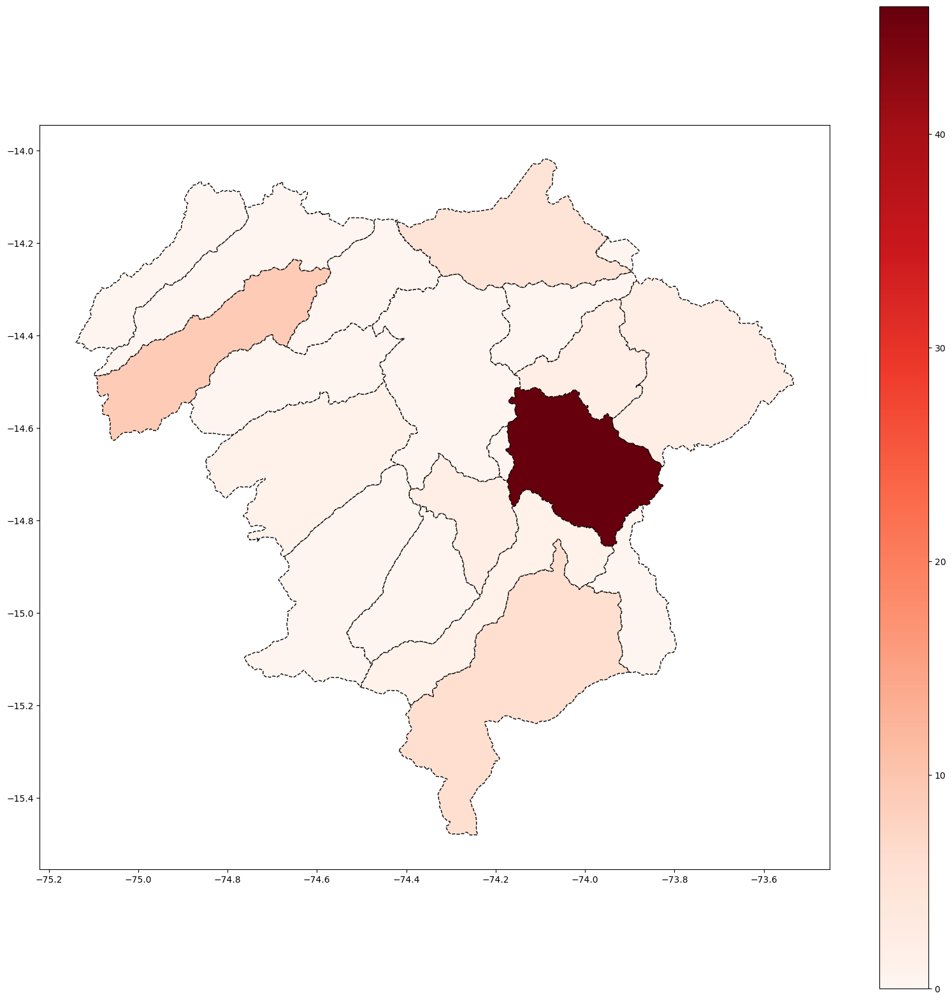

In [141]:
# Covid & Lima Matropolitana 

base_ayacucho.plot(column='Casos', cmap='Reds', figsize=(20, 20), linestyle='--',
                      edgecolor='black', 
                      legend = True)

# save map: CON ESTO PUEDO GUARDAR MI MAPA
plt.savefig(r'Ayacucho_covid_Heatmap.png')

In [48]:
base_lima.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Get Centroid

In [145]:
#Centroide: punto central de un polígono. calculamos la distancia del centroide a un lugar (hospital)
#Usaremos geometría para ubicar ese centroide
base_lima['geometry']

8147     POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...
9090     POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...
11689    POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...
11712    POLYGON ((-77.0721 -12.08358, -77.06348 -12.08...
11735    POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...
11758    POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...
11781    POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...
11850    POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...
12379    POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...
15047    POLYGON ((-76.89995 -11.72979, -76.89921 -11.7...
21579    POLYGON ((-77.03811 -12.06768, -77.03629 -12.0...
22131    POLYGON ((-76.77367 -12.42553, -76.77332 -12.4...
22154    MULTIPOLYGON (((-76.78117 -12.40917, -76.78144...
22315    POLYGON ((-77.00745 -12.16033, -77.00781 -12.1...
22384    POLYGON ((-77.01945 -12.1306, -77.01915 -12.13...
22430    POLYGON ((-76.91078 -12.12233, -76.91191 -12.1...
22453    POLYGON ((-76.95434 -12.11556, -76.95416 -12.1.

In [146]:
# Centroid (point in the center)

#base_lima = base_lima.to_crs("EPSG:32733")
#WGS84 (MAP IN CURVE) > PROJ IN METER "EPSG:24891" TO CALCULATE CENTROID > CONVERT TO CURVE AGAIN (THE CENTROID CAN BE OUT BECAUSE IF THE IMAGE IS CONCAVA)

# la geometría la voy a pasar a una proyección en metros ("EPSG:24891"). luego de ello, calculo el centroide y lo devuelvo al anterior sistema
base_lima['centroid'] = base_lima['geometry'].to_crs("EPSG:24891").centroid.to_crs("EPSG:4326")

#Tenemos que la columna centroide es un punto en el mapa, no una geometría

In [147]:
base_lima

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales,centroid
8147,150119,"POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...",LIMA,LIMA,LURIN,8,2020,452,29,68,POINT (-76.80109 -12.23426)
9090,150102,"POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...",LIMA,LIMA,ANCON,8,2020,460,30,51,POINT (-77.0958 -11.70252)
11689,150131,"POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...",LIMA,LIMA,SAN ISIDRO,8,2020,551,30,86,POINT (-77.03667 -12.09898)
11712,150120,"POLYGON ((-77.0721 -12.08358, -77.06348 -12.08...",LIMA,LIMA,MAGDALENA DEL MAR,8,2020,478,49,94,POINT (-77.06669 -12.09384)
11735,150130,"POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...",LIMA,LIMA,SAN BORJA,8,2020,1012,54,123,POINT (-76.99521 -12.09755)
11758,150116,"POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...",LIMA,LIMA,LINCE,8,2020,855,76,129,POINT (-77.03567 -12.08579)
11781,150140,"POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...",LIMA,LIMA,SANTIAGO DE SURCO,8,2020,2628,171,394,POINT (-76.98431 -12.12699)
11850,150121,"POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...",LIMA,LIMA,PUEBLO LIBRE,8,2020,633,61,140,POINT (-77.06574 -12.07508)
12379,150139,"POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...",LIMA,LIMA,SANTA ROSA,8,2020,114,9,15,POINT (-77.16325 -11.80501)
15047,150106,"POLYGON ((-76.89995 -11.72979, -76.89921 -11.7...",LIMA,LIMA,CARABAYLLO,8,2020,2054,183,281,POINT (-76.97291 -11.80738)


In [51]:
# fig, ax = plt.subplots(figsize=(20, 20))

# # Heatmap Lima and Covid infection

# base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
#                       edgecolor='black', 
#                       legend = True, ax=ax)

In [52]:
props = dict(boxstyle='round', facecolor = 'linen', alpha =1)
props

{'boxstyle': 'round', 'facecolor': 'linen', 'alpha': 1}

In [53]:
# for point in base_lima.iterrows():
#     print(point[1]['Distrito'])

## Add District Names in Centroid

<Axes: >

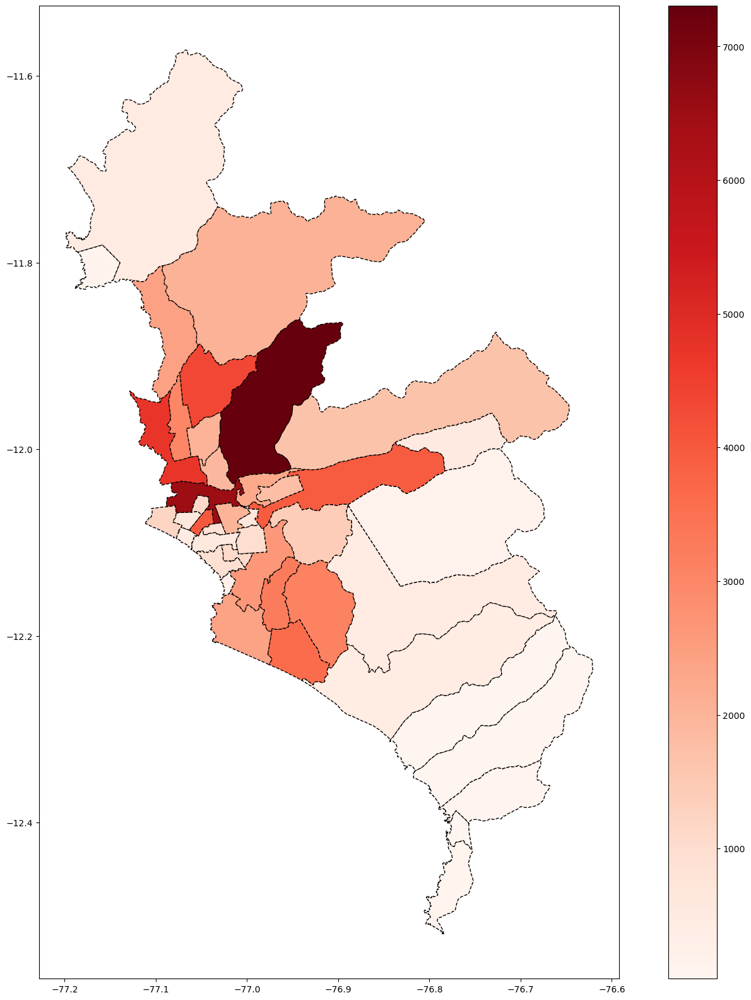

In [148]:
fig, ax = plt.subplots(figsize=(20, 20))

# Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

In [55]:
#base_lima['centroid']

In [56]:
# for point in base_lima.iterrows():
#     print(point[1]['Distrito'])

In [57]:
props = dict(boxstyle='round', facecolor = 'linen', alpha =1)

In [58]:
props

{'boxstyle': 'round', 'facecolor': 'linen', 'alpha': 1}

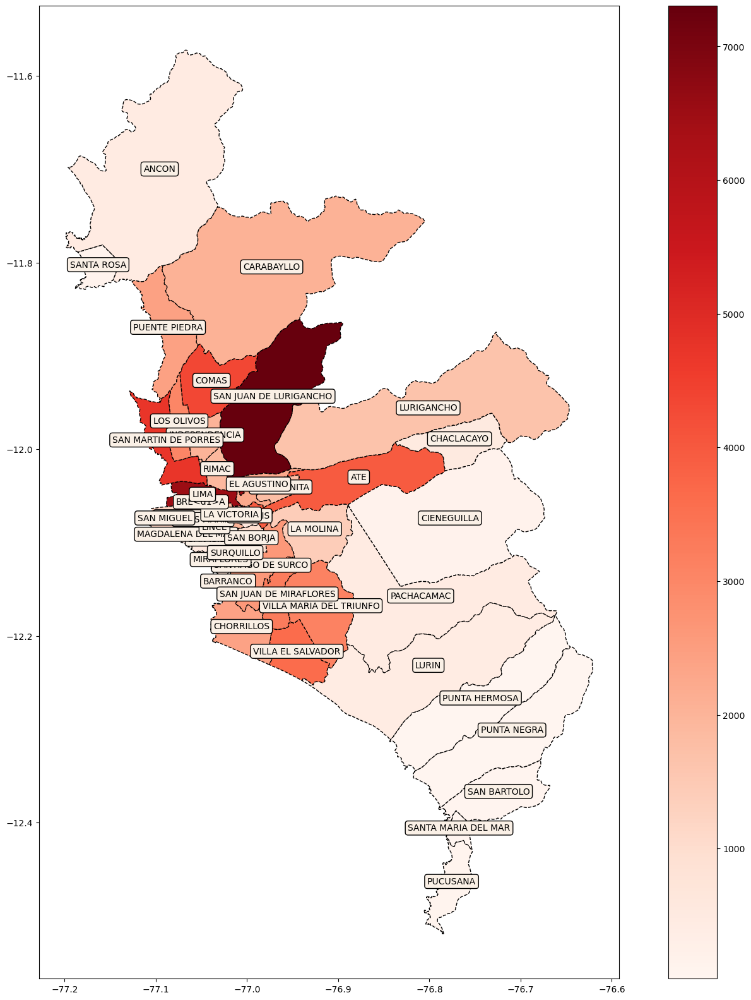

In [59]:
# Vamos a agregar nombres a los puntos de los centroides

#1ero hago mi ploteo Lima. Generaremos un cuadradito en cada distrito con una iteración. Quiero que el texto se coloque en el punto medio

fig, ax = plt.subplots(figsize=(20, 20))

# Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

# add district name in litle box

props = dict(boxstyle='round', facecolor = 'linen', alpha =1)

for point in base_lima.iterrows():
        ax.text( point[1]['centroid'].x,
                 point[1]['centroid'].y,
                 point[1]['Distrito'],
                 horizontalalignment='center',
                 fontsize=10,
                 bbox=props )

plt.savefig(r'Lima_covid_Heatmap_2.png')
#plot.savefig(r'Lima_covid_Heatmap_2.png')

#A este gráfico le falta título y fuente

<Axes: >

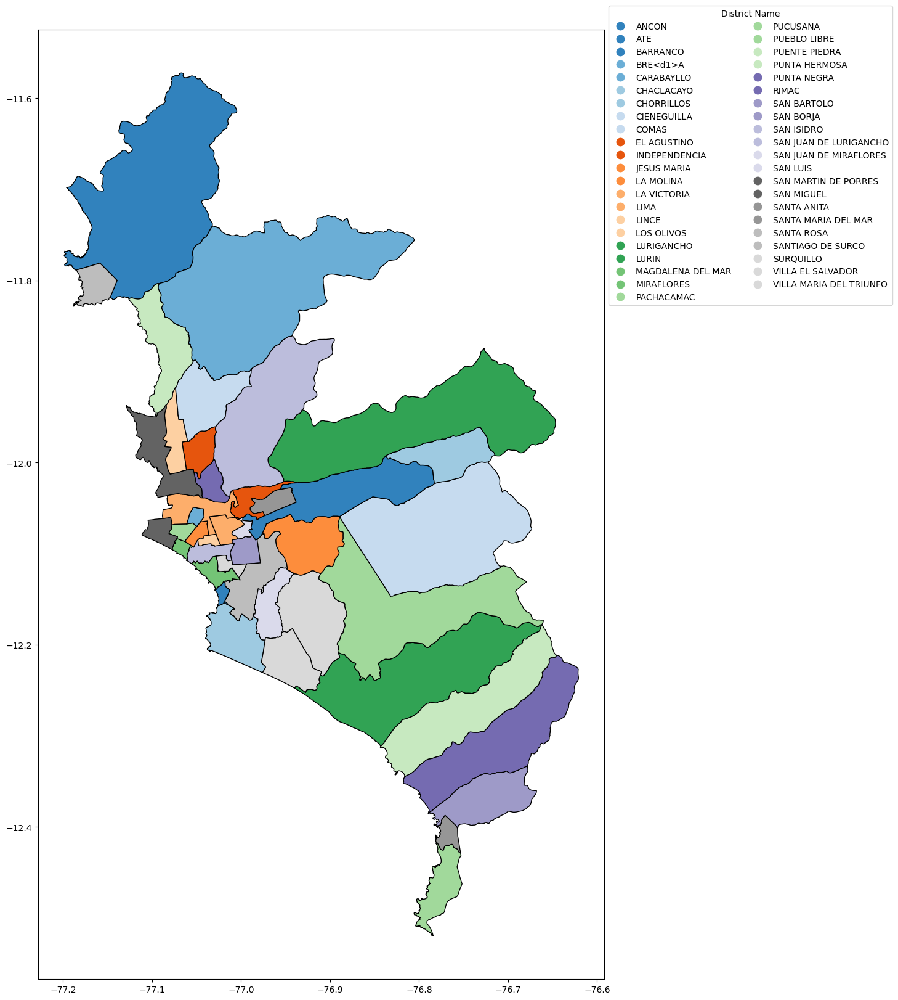

In [60]:
# Using legend by district 

leg_kwds={'title':'District Name',
          'loc': 'upper left',
          'bbox_to_anchor':(1, 1.03),
          'ncol':2}


base_lima.plot(column='Distrito', cmap='tab20c', figsize=(20, 20), legend = True, linestyle='-', 
               edgecolor='black',
               legend_kwds = leg_kwds)

## Public Health Centers Data

In [61]:
base_lima.geometry.iloc[1:2]

#NOTH (x), EAST(Y)

9090    POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...
Name: geometry, dtype: geometry

In [62]:
# import csv file of public health centers: MINSA, ESSALUD and Regional Goverment
# coordinates information (NORTE: longitud) (ESTE: latitud)

health_centers = pd.read_csv(r'../_data/centros_hospitalarios.csv')
health_centers.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Estado,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3


In [63]:
health_centers.columns

Index(['Institución', 'Código Único', 'Nombre del establecimiento',
       'Clasificación', 'Tipo', 'Departamento', 'Provincia', 'Distrito',
       'UBIGEO', 'Dirección', 'Código DISA', 'Código Red', 'Código Microrred',
       'DISA', 'Red', 'Microrred', 'Código UE', 'Unidad Ejecutora',
       'Categoria', 'Teléfono', 'Tipo Doc.Categorización',
       'Nro.Doc.Categorización', 'Horario', 'Inicio de Actividad',
       'Director Médico y/o Responsable de la Atención de Salud', 'Estado',
       'Situación', 'Condición', 'Inspección', 'NORTE', 'ESTE', 'COTA',
       'CAMAS', 'code1', 'code2'],
      dtype='object')

In [64]:
health_centers.NORTE

0      -81.310632
1      -81.306508
2      -81.303974
3      -81.275139
4      -81.273840
          ...    
8459          NaN
8460          NaN
8461          NaN
8462          NaN
8463          NaN
Name: NORTE, Length: 8464, dtype: float64

In [65]:
# DataFrame to GeoDataFrame

Public_health = gpd.GeoDataFrame( health_centers, geometry=gpd.points_from_xy( health_centers.NORTE, health_centers.ESTE ) )
Public_health.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1,POINT (-81.31063 -4.66504)
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1,POINT (-81.30651 -4.65438)
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1,POINT (-81.30397 -4.65863)
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1,POINT (-81.27514 -4.45663)
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.27384 -4.56842)


In [66]:
# Setting UTM Zones (South): "EPSG:32733" #depending on the zone, it is PERU

# Public_health = Public_health.set_crs("EPSG:32733")
Public_health = Public_health.set_crs( "EPSG:32718", allow_override = True)
Public_health.crs

<Projected CRS: EPSG:32718>
Name: WGS 84 / UTM zone 18S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 78°W and 72°W, southern hemisphere between 80°S and equator, onshore and offshore. Argentina. Brazil. Chile. Colombia. Ecuador. Peru.
- bounds: (-78.0, -80.0, -72.0, 0.0)
Coordinate Operation:
- name: UTM zone 18S
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [67]:
Public_health.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1,POINT (-81.311 -4.665)
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1,POINT (-81.307 -4.654)
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1,POINT (-81.304 -4.659)
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1,POINT (-81.275 -4.457)
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.274 -4.568)


## Types and classification public centers

#### We focus on Postas médicas and Hospitales

#### code2 (Type)

ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO:			1

SERVICIO MÉDICO DE APOYO:			                2

ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO:			3


#### code1 (Clasification)

ATENCION PRE HOSPITALARIA:	1

CENTROS DE ATENCION PARA DEPENDIENTES A SUSTANCIAS PSICOACTIVAS Y OTRAS DEPENDENCIAS:	2

CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO:	3

CENTROS DE SALUD O CENTROS MEDICOS:	4

CENTROS DE SALUD O CENTROS MEDICOS,CENTROS DE SALUD O CENTROS MEDICOS:	5

CENTROS DE VACUNACION:	6

CENTROS MEDICOS ESPECIALIZADOS:	7

CONSULTORIOS MEDICOS Y DE OTROS PROFESIONALES DE LA SALUD:	8

ESTABLECIMIENTOS DE RECUPERACION O REPOSO:	9

HEMODIALISIS:	10

HOSPITALES O CLINICAS DE ATENCION ESPECIALIZADA:	11

HOSPITALES O CLINICAS DE ATENCION GENERAL:	12

INSTITUTOS DE SALUD ESPECIALIZADOS:	13

MEDICINA FISICA,REHABILITACION:	14

PATOLOGIA CLINICA:	15

PATOLOGIA CLINICA,ANATOMIA PATOLOGICA:	16

PATOLOGIA CLINICA,DIAGNOSTICO POR IMAGENES:	17

POLICLINICOS:	18

PUESTOS DE SALUD O POSTAS DE SALUD:	19

PUESTOS DE SALUD O POSTAS DE SALUD,PUESTOS DE SALUD O POSTAS DE SALUD:	19

SERVICIO DE TRASLADO DE PACIENTES:	20

SERVICIO DE TRASLADO DE PACIENTES,ATENCION DOMICILIARIA:	21

SERVICIO DE TRASLADO DE PACIENTES,ATENCION DOMICILIARIA,ATENCION PRE HOSPITALARIA:	22

SERVICIO DE TRASLADO DE PACIENTES,ATENCION PRE HOSPITALARIA:	23

CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO:	24


In [68]:
Public_health.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1,POINT (-81.311 -4.665)
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1,POINT (-81.307 -4.654)
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1,POINT (-81.304 -4.659)
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1,POINT (-81.275 -4.457)
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.274 -4.568)


In [69]:
# code1 = 19 to postas médicas 
# code1 = 12 & 24 to Hospitals

Public_health1 = Public_health[Public_health.code1 == "19"]

Public_health2 = Public_health[(Public_health.code1 == "12") | (Public_health.code1 == "24")]
Public_health2.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.274 -4.568)
5,GOBIERNO REGIONAL,2074,TALARA II,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AVENIDA GRAU S/N EXPOLICLINICO PETROPERU,...,,EN FUNCIONAMIENTO,,-81.272096,-4.578829,21.1,NaN,24,3,POINT (-81.272 -4.579)
19,ESSALUD,11763,HOSPITAL I MIGUEL CRUZADO VERA - PAITA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,PAITA,PAITA,200501,CARRETERA PAITA - PIURA KM 1.5,...,,EN FUNCIONAMIENTO,,-81.100243,-5.087583,75.9,12.0,24,3,POINT (-81.1 -5.088)
20,GOBIERNO REGIONAL,2021,HOSPITAL LAS MERCEDES-PAITA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,PAITA,PAITA,200501,LOS PESCADORES S/N LA PUNTA,...,,EN FUNCIONAMIENTO,,-81.091531,-5.090815,78.3,79.0,12,3,POINT (-81.092 -5.091)
23,GOBIERNO REGIONAL,2026,PUEBLO NUEVO DE COLAN,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,PAITA,COLAN,200504,JR. ALFONSO UGARTE S/N,...,,EN FUNCIONAMIENTO,,-81.058005,-4.911551,16.6,NaN,24,3,POINT (-81.058 -4.912)


In [70]:
# # Quantiles quantity of infection 

# base_lima.plot(column='Casos', cmap='Set2', figsize=(20, 20), linestyle=':', 
#                edgecolor='black',
#                legend = True)

In [71]:
# Postas Médicas and Hospitales públicos - LIMA

PH_lima_postas = Public_health1[Public_health1.Provincia == "LIMA"]

PH_lima_hospitales = Public_health2[Public_health2.Provincia == "LIMA"]
PH_lima_hospitales

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
2715,MINSA,5814,CENTRO DE SALUD MATERNO INFANTIL ANCON,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,ANCON,150102,JR. LOA 595 ANCON,...,,EN FUNCIONAMIENTO,,-77.172725,-11.774719,12.0,NaN,24,3,POINT (-77.173 -11.775)
2803,MINSA,5816,MATERNO INFANTIL DR. ENRIQUE MARTIN ALTUNA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,ASOC VIV E INDUSTRIAS VIRGEN DE LAS NIEVES URB...,...,,EN FUNCIONAMIENTO,,-77.109100,-11.837611,200.0,NaN,24,3,POINT (-77.109 -11.838)
2832,ESSALUD,8564,HOSPITAL I OCTAVIO MONGRUT MUÑOZ,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,SAN MIGUEL,150136,AV PARQUE DE LAS LEYENDAS 255,...,,EN FUNCIONAMIENTO,,-77.094583,-12.065961,NaN,49.0,12,3,POINT (-77.095 -12.066)
2852,MINSA,5817,SANTA ROSA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,"AA.HH. SANTA ROSA, MZ. 50, LOTE PM - AV. SANTA...",...,,EN FUNCIONAMIENTO,,-77.081693,-11.874827,200.0,NaN,24,3,POINT (-77.082 -11.875)
2859,MINSA,7632,HOSPITAL CARLOS LANFRANCO LA HOZ,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,AV. SAENZ PEÑA - CUADRA 6 S/N,...,,EN FUNCIONAMIENTO,,-77.079335,-11.863181,NaN,102.0,12,3,POINT (-77.079 -11.863)
2862,MINSA,5799,CLAS JUAN PABLO II,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,LOS OLIVOS,150117,CALLE 28 S/N AA.HH. JUAN PABLO II,...,,EN FUNCIONAMIENTO,,-77.078891,-11.953212,63.0,NaN,24,3,POINT (-77.079 -11.953)
2875,MINSA,5821,LOS SUREÑOS,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,COOP. VIVIENDA LOS SUREÑOS MZ M LT. 35,...,,EN FUNCIONAMIENTO,,-77.069701,-11.887532,200.0,NaN,24,3,POINT (-77.07 -11.888)
2879,MINSA,6196,MAGDALENA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,MAGDALENA DEL MAR,150120,JR. JUNÍN 322,...,,EN FUNCIONAMIENTO,,-77.068627,-12.088694,27.0,NaN,24,3,POINT (-77.069 -12.089)
2887,MINSA,6214,HOSPITAL VICTOR LARCO HERRERA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,MAGDALENA DEL MAR,150120,AV.AUGUSTO PEREZ ARANIBAR N° 600,...,,EN FUNCIONAMIENTO,,-77.065756,-12.098705,NaN,590.0,12,3,POINT (-77.066 -12.099)
2904,MINSA,5772,CENTRO MATERNO INFANTIL SANTA LUZMILA II,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,COMAS,150110,AVENIDA AV. 22 DE AGOSTO N° 1001- URB SANTA LU...,...,,EN FUNCIONAMIENTO,,-77.058712,-11.947025,101.0,NaN,24,3,POINT (-77.059 -11.947)


## Covid y Postas

<Axes: >

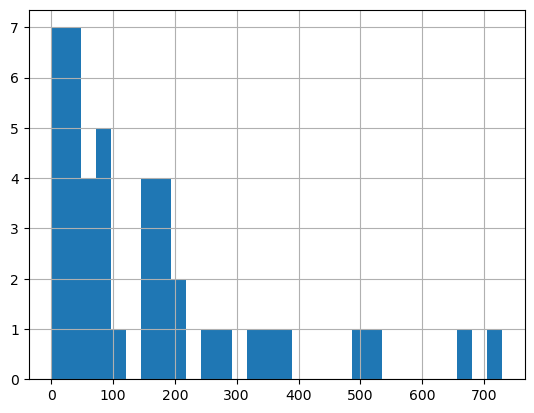

In [72]:
base_lima["Muertes Covid"].hist(bins=30)

In [73]:
PH_lima_postas

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
2725,MINSA,5824,SAN JOSE,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,ANCON,150102,ESQ. CALLE Nº 17 Y CALLE Nº 9 URB. DE INTERES ...,...,,EN FUNCIONAMIENTO,,-77.162575,-11.778237,12.0,NaN,19,1,POINT (-77.163 -11.778)
2728,MINSA,14727,PROFAM,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,SANTA ROSA,150139,"AV. SANTA ROSA, MANZANA O-2 / ASOCIACION DE VI...",...,,EN FUNCIONAMIENTO,,-77.159128,-11.817327,NaN,NaN,19,1,POINT (-77.159 -11.817)
2740,MINSA,16525,VILLAS DE ANCON,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,ANCON,150102,MZ X ASOCIACION PRO-VIVIENDA VILLAS DE ANCON,...,,EN FUNCIONAMIENTO,,-77.145966,-11.733970,0.0,NaN,19,1,POINT (-77.146 -11.734)
2762,MINSA,5825,VIRGEN DE LAS MERCEDES,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,SANTA ROSA,150139,ASOC. VIV. SANTA ROSA MZ. B LT. 09,...,,EN FUNCIONAMIENTO,,-77.131677,-11.815250,12.0,NaN,19,1,POINT (-77.132 -11.815)
2797,MINSA,5750,CERRO LA REGLA,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,SAN MARTIN DE PORRES,150135,"MZ B LT 11 - AAHH ESPERANZA, COMITÉ 2",...,,EN FUNCIONAMIENTO,,-77.115765,-11.989613,123.0,NaN,19,1,POINT (-77.116 -11.99)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3486,MINSA,5868,SEÑOR DE LOS MILAGROS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,LURIGANCHO,150118,AVENIDA AV.PRECURSORES S/N AAHH NICOLAS DE PIE...,...,,EN FUNCIONAMIENTO,,-76.714793,-11.935857,911.0,NaN,19,1,POINT (-76.715 -11.936)
3516,MINSA,5870,PABLO PATRON,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,LURIGANCHO,150118,AAHH PABLO PATRON - CALLE 14 MZ. V LOTE 7 DIST...,...,,EN FUNCIONAMIENTO,,-76.686205,-11.930408,911.0,NaN,19,1,POINT (-76.686 -11.93)
3519,MINSA,5867,MARISCAL CASTILLA,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,LURIGANCHO,150118,CALLE SANTA ROSA MZ O S/N - AAHH MARISCAL CAST...,...,,EN FUNCIONAMIENTO,,-76.685491,-11.933911,911.0,NaN,19,1,POINT (-76.685 -11.934)
8125,MINSA,5940,HUASCATA,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,CHACLACAYO,150107,OTROS MZ N LOTE 05 AAHH CERRO VECINO HUASCATA-...,...,,EN FUNCIONAMIENTO,,NaN,NaN,NaN,NaN,19,1,POINT (NaN NaN)


<Axes: >

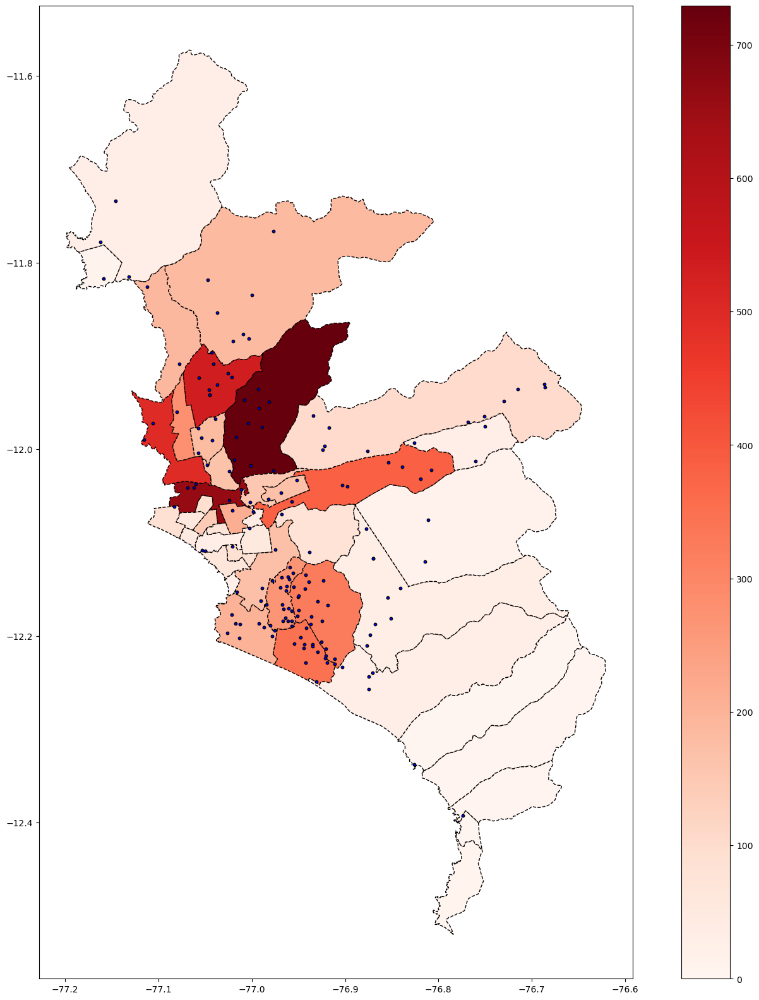

In [74]:
# Covid deaths and Postas médicas 

fig, ax = plt.subplots(figsize=(20, 20))

#Heatmap Lima and Covid infection

base_lima.plot( column='Muertes Covid', 
               cmap='Reds', 
               linestyle='--',
               edgecolor='black', 
               legend = True, 
               ax=ax )

# Plot in the shapefile (R style)
PH_lima_postas.plot(ax = ax, color = 'blue', markersize=10, edgecolor='black')

## Hospitales Públicos y Postas Médicas

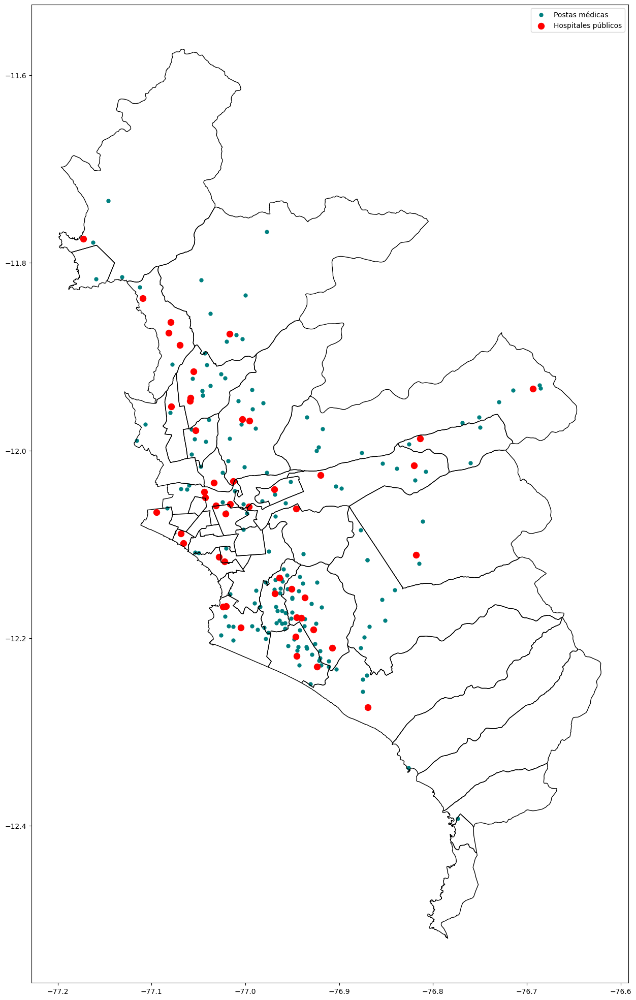

In [75]:
ax = base_lima.plot(figsize=(25, 25), color='none', edgecolor='black', zorder=3)

PH_lima_postas.plot(color='teal', label = "Postas médicas", markersize=25, ax=ax)
PH_lima_hospitales.plot(color='red', label = "Hospitales públicos", markersize=75, ax=ax)

plt.legend(loc='upper right')

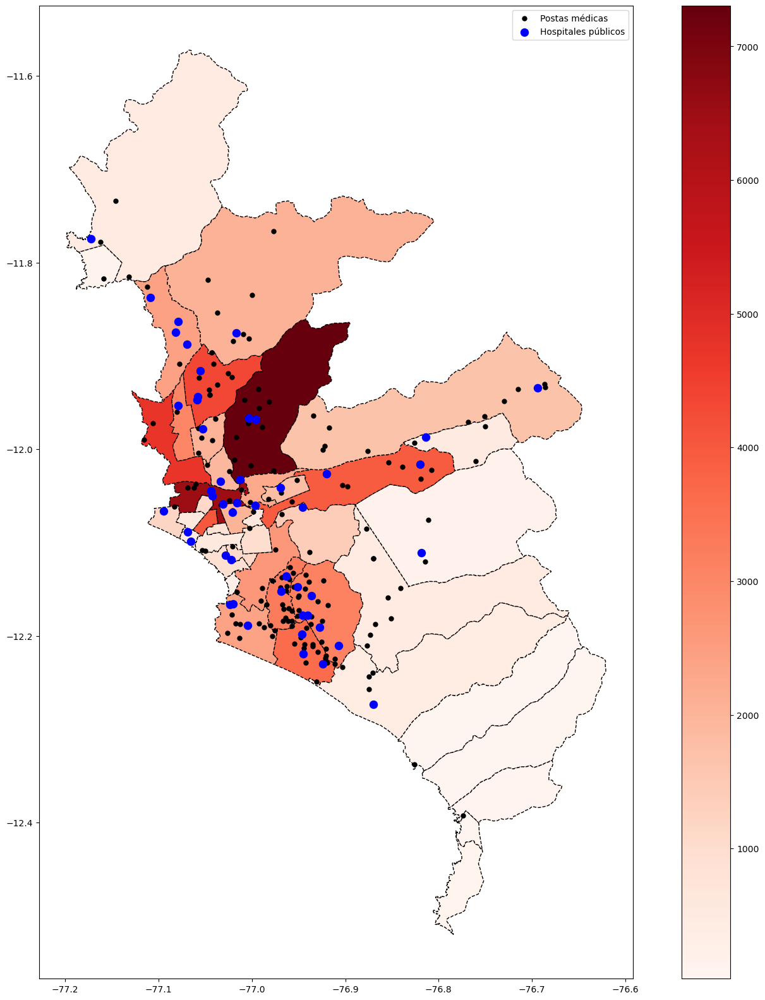

In [76]:
# Covid infection and Postas médicas 

fig, ax = plt.subplots(figsize=(20, 20))

#Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

PH_lima_postas.plot(color='black', label = "Postas médicas", markersize=25, ax=ax)
PH_lima_hospitales.plot(color='blue', label = "Hospitales públicos", markersize=75, ax=ax)

plt.legend(loc='upper right')

In [77]:
PH_lima_hospitales['CAMAS'].describe

<bound method NDFrame.describe of 2715      NaN
2803      NaN
2832     49.0
2852      NaN
2859    102.0
2862      NaN
2875      NaN
2879      NaN
2887    590.0
2904      NaN
2905    106.0
2912      NaN
2927      NaN
2943     49.0
2955    662.0
2984      NaN
2988    231.0
2997     84.0
3009      NaN
3017      NaN
3023      NaN
3027      NaN
3036      NaN
3040    594.0
3048      NaN
3071      NaN
3077    150.0
3093      6.0
3096     54.0
3161      6.0
3164      NaN
3175      NaN
3204      NaN
3213      NaN
3214     50.0
3216      NaN
3217      NaN
3230    199.0
3238      NaN
3255      NaN
3262      NaN
3269    111.0
3284      NaN
3322      NaN
3363     51.0
3370      NaN
3382     10.0
3508     67.0
7909     57.0
Name: CAMAS, dtype: float64>

In [78]:
# drop raws with nan values 

PH_lima_hospitales = PH_lima_hospitales.dropna(subset=['CAMAS'])

In [79]:
#markersize

## Relative Size of Markers from panda series

In [80]:
PH_lima_hospitales["CAMAS"]

2832     49.0
2859    102.0
2887    590.0
2905    106.0
2943     49.0
2955    662.0
2988    231.0
2997     84.0
3040    594.0
3077    150.0
3093      6.0
3096     54.0
3161      6.0
3214     50.0
3230    199.0
3269    111.0
3363     51.0
3382     10.0
3508     67.0
7909     57.0
Name: CAMAS, dtype: float64

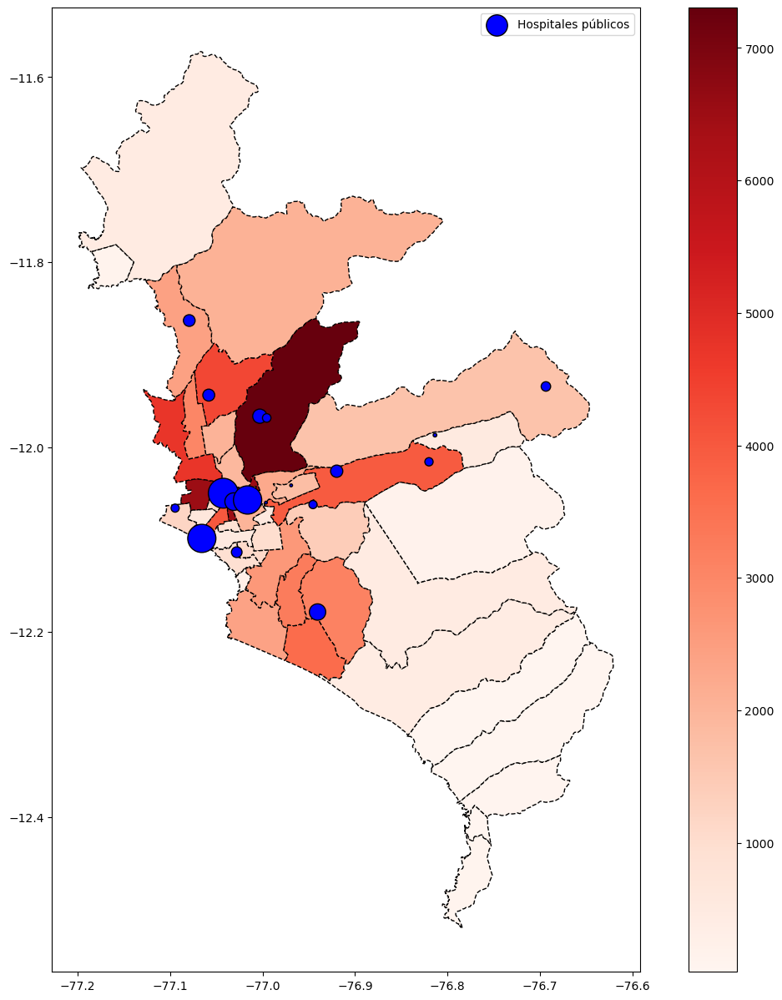

In [81]:
# Covid infection and Public Hospital by number of beds 

fig, ax = plt.subplots(figsize=(15, 15))

#define the size
markersize=PH_lima_hospitales['CAMAS']

#Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

PH_lima_hospitales.plot( ax=ax, color='blue', label = "Hospitales públicos", markersize = markersize,
                       edgecolor='black')
plt.legend(loc='upper right')

<Axes: >

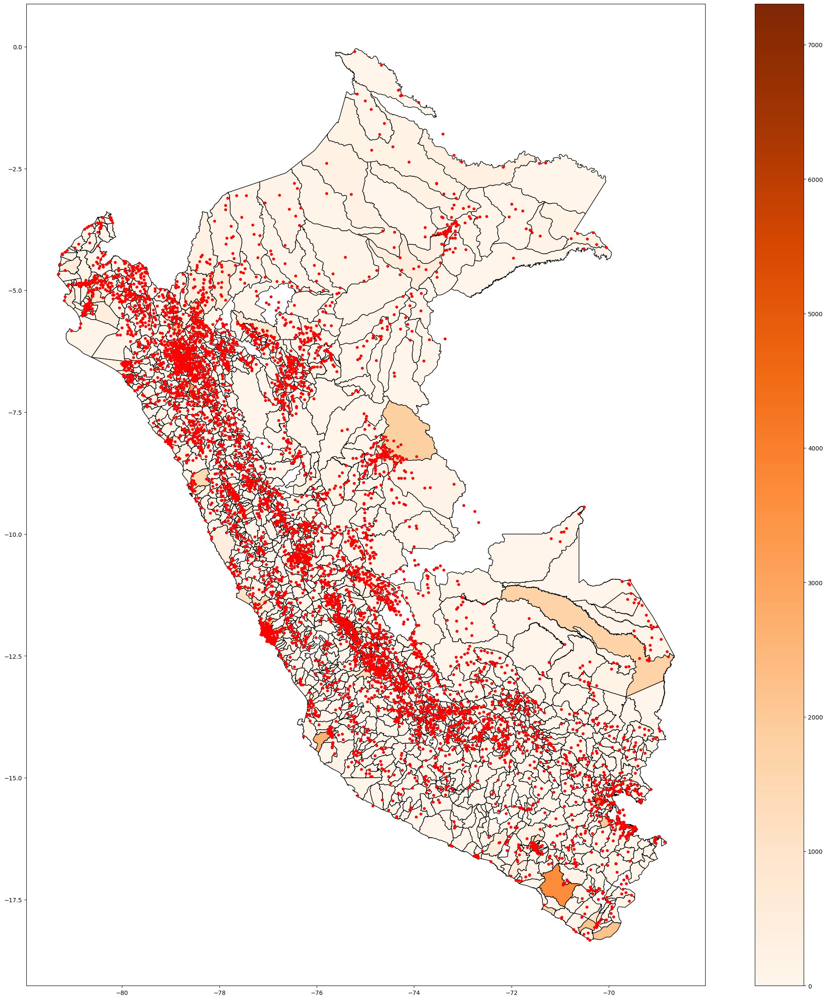

In [82]:
# Covid infection & postas médicas at the national level 

gf = base.plot(column='Casos', cmap='Oranges', 
          figsize=(30, 30),
          linestyle='-',
          edgecolor='black',
          legend = True)

Public_health1.plot(ax = gf, color = 'red', markersize=15)

## Select Districts

In [83]:
base_lima = base_lima.set_index("Distrito")

In [84]:
base_lima

,UBIGEO,geometry,Departamento,Provincia,Mes,Año,Casos,Muertes Covid,Muertes totales,centroid
Distrito,,,,,,,,,,
LURIN,150119,"POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...",LIMA,LIMA,8,2020,452,29,68,POINT (-76.80109 -12.23426)
ANCON,150102,"POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...",LIMA,LIMA,8,2020,460,30,51,POINT (-77.0958 -11.70252)
SAN ISIDRO,150131,"POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...",LIMA,LIMA,8,2020,551,30,86,POINT (-77.03667 -12.09898)
MAGDALENA DEL MAR,150120,"POLYGON ((-77.0721 -12.08358, -77.06348 -12.08...",LIMA,LIMA,8,2020,478,49,94,POINT (-77.06669 -12.09384)
SAN BORJA,150130,"POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...",LIMA,LIMA,8,2020,1012,54,123,POINT (-76.99521 -12.09755)
LINCE,150116,"POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...",LIMA,LIMA,8,2020,855,76,129,POINT (-77.03567 -12.08579)
SANTIAGO DE SURCO,150140,"POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...",LIMA,LIMA,8,2020,2628,171,394,POINT (-76.98431 -12.12699)
PUEBLO LIBRE,150121,"POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...",LIMA,LIMA,8,2020,633,61,140,POINT (-77.06574 -12.07508)
SANTA ROSA,150139,"POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...",LIMA,LIMA,8,2020,114,9,15,POINT (-77.16325 -11.80501)


In [85]:
base_lima.buffer(10000)

C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\1713097020.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima.buffer(10000)


Distrito
LURIN                      POLYGON ((-907.44458 9940.34876, -908.5145 995...
ANCON                      POLYGON ((-10070.83393 214.65838, -10071.54511...
SAN ISIDRO                 POLYGON ((-6569.98336 7593.29451, -5804.27878 ...
MAGDALENA DEL MAR          POLYGON ((-6950.49655 7251.25149, -6191.31465 ...
SAN BORJA                  POLYGON ((-1770.6679 9843.44877, -791.27992 99...
LINCE                      POLYGON ((-1448.68595 9893.40233, -503.73208 9...
SANTIAGO DE SURCO          POLYGON ((-3326.57958 9440.7763, -3327.93789 9...
PUEBLO LIBRE               POLYGON ((6246.29993 7734.88076, 6978.22097 70...
SANTA ROSA                 POLYGON ((6739.98962 7295.68218, 6744.33819 73...
CARABAYLLO                 POLYGON ((-824.5629 9955.13637, -824.94665 996...
JESUS MARIA                POLYGON ((9774.92742 -1670.75098, 9646.93969 -...
PUCUSANA                   POLYGON ((-10067.49189 -109.85715, -10076.3141...
SANTA MARIA DEL MAR        POLYGON ((-10072.02469 285.02259, -10072

In [86]:
# Get buffered region and centroid points
base_lima["buffered"] = base_lima.buffer(10000)
base_lima['centroid'] = base_lima.centroid

C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\2755669895.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima["buffered"] = base_lima.buffer(10000)
C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\2755669895.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima['centroid'] = base_lima.centroid


<Axes: >

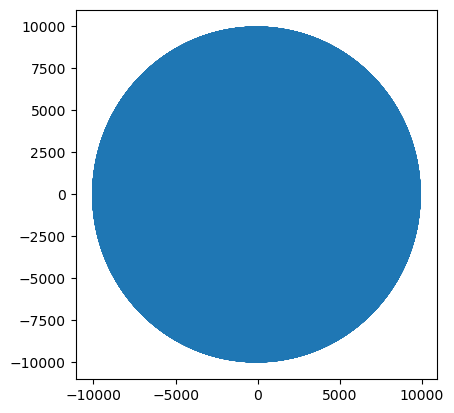

In [87]:
base_lima.buffered.plot()

<Axes: >

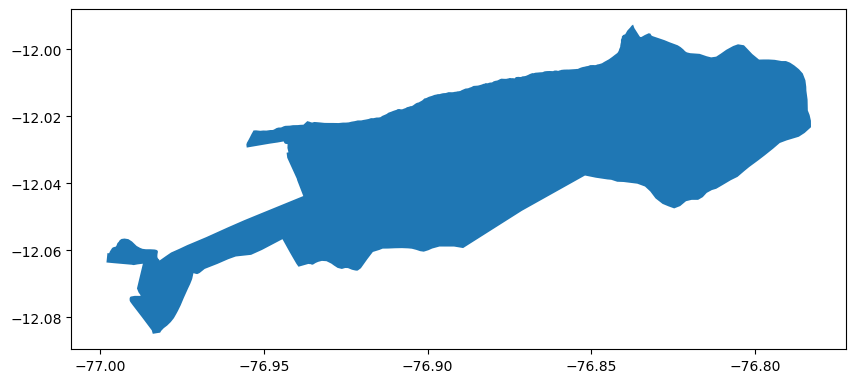

In [88]:
ATE = base_lima[base_lima.UBIGEO == 150103]
ATE.plot(figsize=(10, 10))

<Axes: >

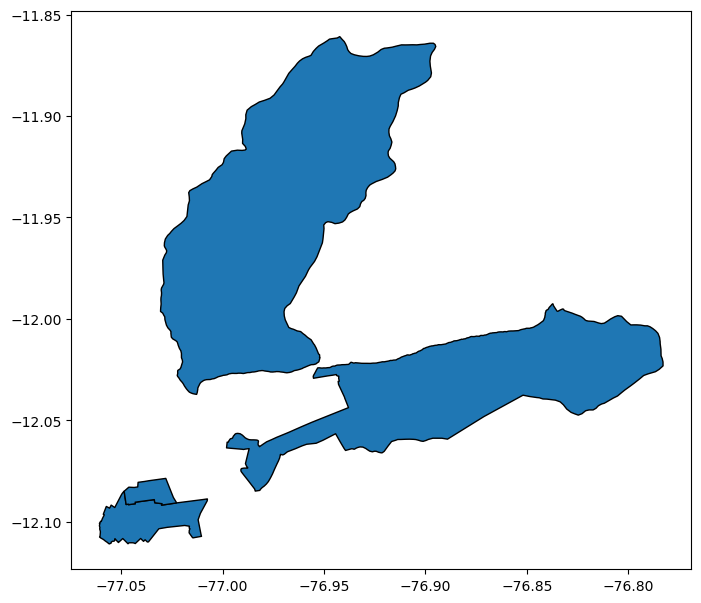

In [89]:
#Plot selectec districs 

ATE = base_lima.loc["ATE", "geometry"]
SJL = base_lima.loc["SAN JUAN DE LURIGANCHO", "geometry"]
SI = base_lima.loc["SAN ISIDRO", "geometry"]
LC = base_lima.loc["LINCE", "geometry"]

gpd.GeoSeries([ATE,SJL,SI,LC]).plot(figsize=(8, 8),linestyle='-',
                                    edgecolor='black')

## Limits - Boarders

In [90]:
# Logic operations:

# Lince and San Isidro share limits 

LC.touches(SI)

True

In [91]:
LC.touches(ATE)

False

In [92]:
#Distance ATE y (SAN ISIDRO, LINCE)

ATE.distance(SI)

0.021430816237973403

<Axes: >

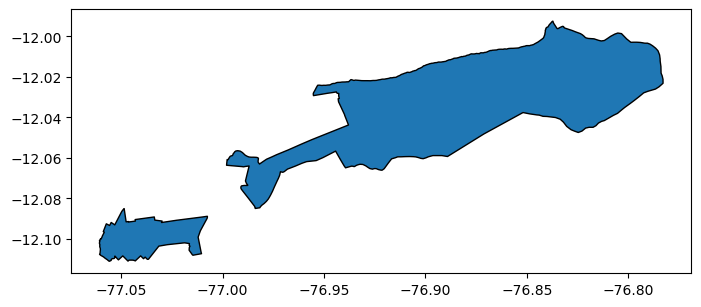

In [93]:
gpd.GeoSeries([ATE, SI]).plot(figsize=(8, 8),linestyle='-',
                                    edgecolor='black')

In [94]:
ATE.distance(LC)

0.03353670040995021

In [95]:
# Add line that cross Lince and ATE

ate_point = base_lima['centroid']['ATE']
lc_point = base_lima['centroid']['LINCE']
sb_point = base_lima['centroid']['SAN BORJA']
lr_point = base_lima['centroid']['LURIN']
ac_point = base_lima['centroid']['ANCON']


<Axes: >

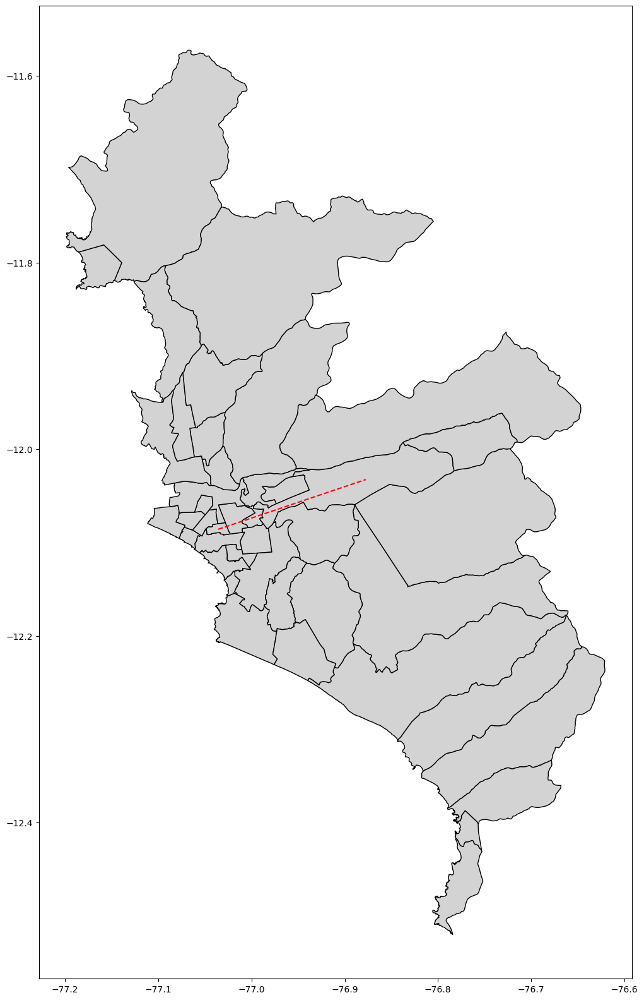

In [96]:
# Add line that cross Lince and ATE

ate_lince = LineString(zip((ate_point.x , lc_point.x ), (ate_point.y, lc_point.y)))

fig, ax = plt.subplots(figsize=(20,20))
base_lima.plot(color='lightgray', ax=ax, linestyle='-',
                                    edgecolor='black')

gpd.GeoSeries([ate_lince]).plot(color='red', linestyle='--', ax = ax)

In [97]:
base_lima['area']=base_lima.area
base_lima

C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\3468981840.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima['area']=base_lima.area


,UBIGEO,geometry,Departamento,Provincia,Mes,Año,Casos,Muertes Covid,Muertes totales,centroid,buffered,area
Distrito,,,,,,,,,,,,
LURIN,150119,"POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...",LIMA,LIMA,8,2020,452,29,68,POINT (-76.80111 -12.23426),"POLYGON ((-907.44458 9940.34876, -908.5145 995...",0.015586
ANCON,150102,"POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...",LIMA,LIMA,8,2020,460,30,51,POINT (-77.09581 -11.70253),"POLYGON ((-10070.83393 214.65838, -10071.54511...",0.025751
SAN ISIDRO,150131,"POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...",LIMA,LIMA,8,2020,551,30,86,POINT (-77.03667 -12.09898),"POLYGON ((-6569.98336 7593.29451, -5804.27878 ...",0.000805
MAGDALENA DEL MAR,150120,"POLYGON ((-77.0721 -12.08358, -77.06348 -12.08...",LIMA,LIMA,8,2020,478,49,94,POINT (-77.06669 -12.09384),"POLYGON ((-6950.49655 7251.25149, -6191.31465 ...",0.000271
SAN BORJA,150130,"POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...",LIMA,LIMA,8,2020,1012,54,123,POINT (-76.99521 -12.09755),"POLYGON ((-1770.6679 9843.44877, -791.27992 99...",0.000860
LINCE,150116,"POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...",LIMA,LIMA,8,2020,855,76,129,POINT (-77.03567 -12.08579),"POLYGON ((-1448.68595 9893.40233, -503.73208 9...",0.000228
SANTIAGO DE SURCO,150140,"POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...",LIMA,LIMA,8,2020,2628,171,394,POINT (-76.98431 -12.12699),"POLYGON ((-3326.57958 9440.7763, -3327.93789 9...",0.002882
PUEBLO LIBRE,150121,"POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...",LIMA,LIMA,8,2020,633,61,140,POINT (-77.06574 -12.07508),"POLYGON ((6246.29993 7734.88076, 6978.22097 70...",0.000386
SANTA ROSA,150139,"POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...",LIMA,LIMA,8,2020,114,9,15,POINT (-77.16325 -11.80501),"POLYGON ((6739.98962 7295.68218, 6744.33819 73...",0.001446


In [98]:
#Distamce between San Juan de Lurigancho to other districs 

SJL_point = base_lima['centroid']["SAN JUAN DE LURIGANCHO"]
    
base_lima['distance'] = base_lima['centroid'].distance(SJL_point)

C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\3552139678.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima['distance'] = base_lima['centroid'].distance(SJL_point)


In [99]:
base_lima['distance'].sort_values(ascending=False)

Distrito
PUCUSANA                   0.555547
SANTA MARIA DEL MAR        0.505632
SAN BARTOLO                0.490367
PUNTA NEGRA                0.443395
PUNTA HERMOSA              0.395445
LURIN                      0.334878
VILLA EL SALVADOR          0.274567
ANCON                      0.273336
PACHACAMAC                 0.268347
CHORRILLOS                 0.249065
SANTA ROSA                 0.237993
CIENEGUILLA                0.233781
VILLA MARIA DEL TRIUNFO    0.230486
SAN JUAN DE MIRAFLORES     0.211952
CHACLACAYO                 0.209580
BARRANCO                   0.204123
MIRAFLORES                 0.184133
SANTIAGO DE SURCO          0.181479
SAN MIGUEL                 0.176307
MAGDALENA DEL MAR          0.175867
SURQUILLO                  0.172533
LURIGANCHO                 0.170624
SAN ISIDRO                 0.166317
PUEBLO LIBRE               0.159857
LINCE                      0.153848
SAN BORJA                  0.153424
JESUS MARIA                0.152794
LA MOLINA          

<Axes: xlabel='Distrito'>

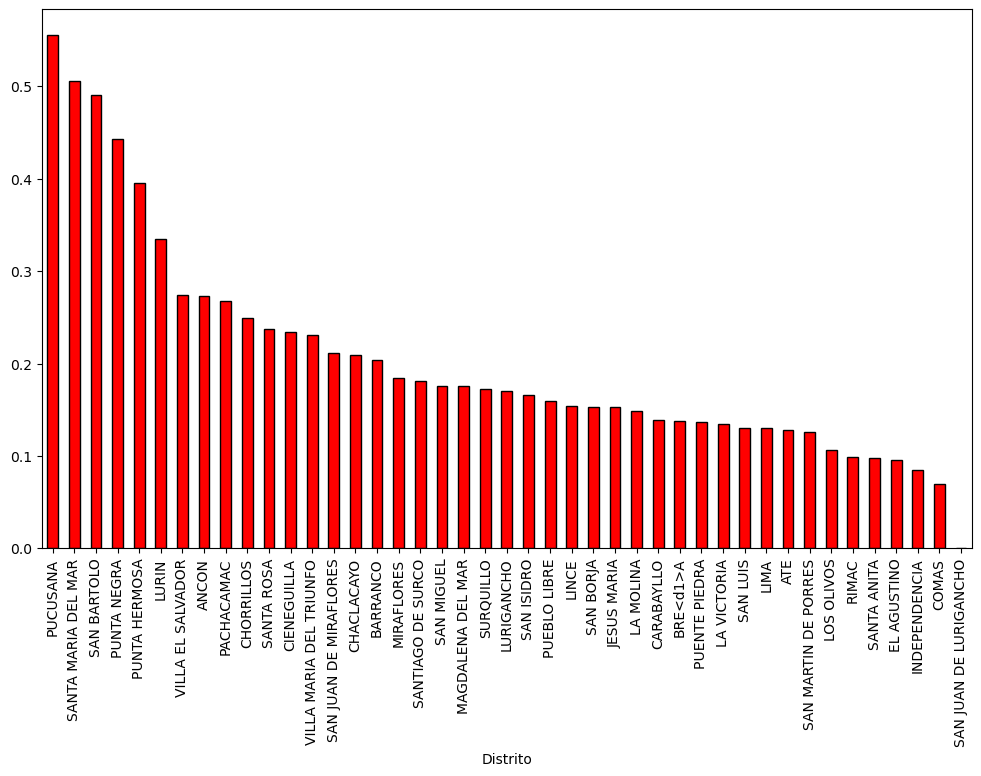

In [100]:

base_lima['distance'].sort_values(ascending=False).plot.bar(figsize=(12, 7), color = 'red', edgecolor='black')

In [101]:
ate_point.type

C:\Users\rtalancha\AppData\Local\Temp\ipykernel_28212\1350904785.py:1: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  ate_point.type


'Point'

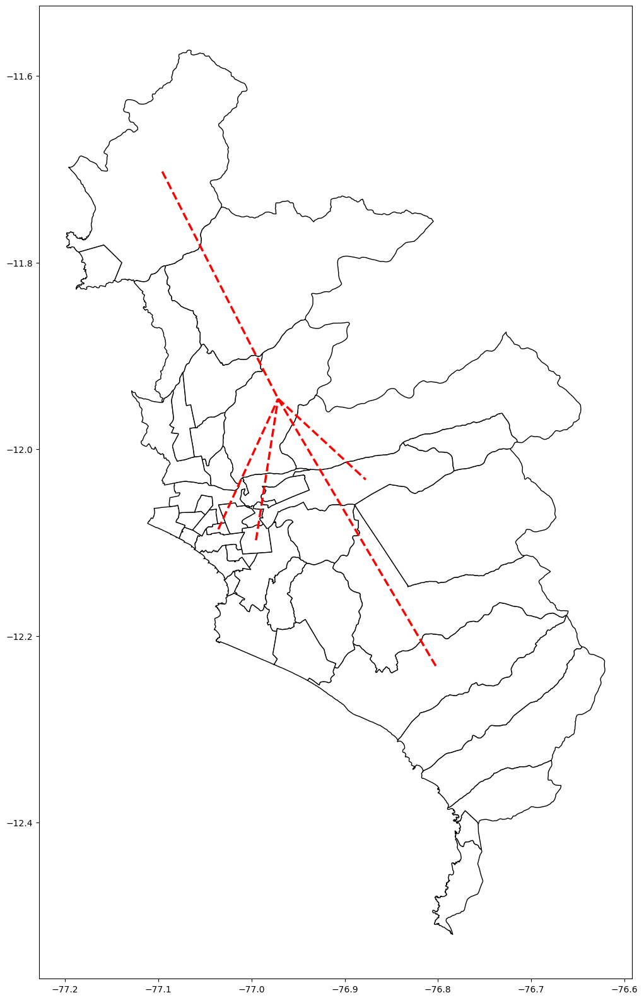

In [102]:
# SJL and other districs 

d1 = LineString(zip((SJL_point.x , lc_point.x ), (SJL_point.y, lc_point.y)))
d2 = LineString(zip((SJL_point.x , ate_point.x ), (SJL_point.y, ate_point.y)))
d3 = LineString(zip((SJL_point.x , sb_point.x ), (SJL_point.y, sb_point.y)))
d4 = LineString(zip((SJL_point.x , lr_point.x ), (SJL_point.y, lr_point.y)))
d5 = LineString(zip((SJL_point.x , ac_point.x ), (SJL_point.y, ac_point.y)))

fig, ax = plt.subplots(figsize=(20,20))
base_lima.plot(color='white', ax=ax, linestyle='-',
                                    edgecolor='black')

for i in range(1,6):
    gpd.GeoSeries(globals()[f'd{i}']).plot(color='red', linestyle='--', ax = ax, linewidth = 2.5)



## ArcGis Operations in Geopandas

In [103]:
dist_shp = gpd.read_file(r'../_data/shape_file/DISTRITOS.shp')

### Get Centroids
Get the centroids of each geometry (district).

In [104]:
dist_shp.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [105]:
dist_shp.to_crs(24891).centroid.to_crs( 4326 )

0        POINT (-75.46643 -9.63426)
1         POINT (-74.8663 -9.00133)
2        POINT (-75.04801 -8.82493)
3        POINT (-75.27987 -8.95039)
4        POINT (-75.04902 -8.64129)
                   ...             
1868     POINT (-76.03798 -9.20808)
1869     POINT (-76.00134 -9.08221)
1870     POINT (-75.98295 -8.98489)
1871    POINT (-70.12642 -15.40623)
1872    POINT (-77.44521 -11.00357)
Length: 1873, dtype: geometry

In [106]:
dist_shp.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

We get warnings since we need to reproject this shapefile object to a CRS in meters. This CRS should be a plane area to the specific zone of the shapefile ([more info](https://stackoverflow.com/questions/63004400/getting-a-userwarning-when-calculating-centroid-of-a-geoseries)). In the case of Peru, we use 24891 ([more info](https://epsg.io/24891)).



In [107]:
projected_dist_shp = dist_shp.to_crs( epsg = 24891 )

projected_dist_shp[ 'centroids'] = projected_dist_shp.centroid

Then, we reproject again the centroids to the original CRS.

In [108]:
dist_shp[ 'Centroid_Latitude' ] = projected_dist_shp[ 'centroids' ].to_crs( epsg = 4326 ).y
dist_shp[ 'Centroid_Longitude' ] = projected_dist_shp[ 'centroids' ].to_crs( epsg = 4326 ).x

## Intersection

In [109]:
health_centers = pd.read_csv( r"../_data\salud_places_peru.csv")

In [110]:
ht1 = health_centers[ health_centers.latitud != 0 ]

In [111]:
# Make ht1 a geopandas
ht1_geo = gpd.GeoDataFrame( ht1 , 
                           geometry= gpd.points_from_xy( 
                                      ht1.longitud, 
                                      ht1.latitud))

Check CRS

We found that geolocation is recognized by google maps. We set the CRS that correspond to google maps.

In [112]:
ht1_geo_crs = ht1_geo.set_crs( epsg = 4326 )

Find Ubigeo for each point

In [113]:
# Just take 10% of observations
ht2_geo = ht1_geo_crs.sample( frac = 0.10 )

In [114]:
# Intersect with maps
intersected_ht = gpd.overlay( ht2_geo , maps , how = 'intersection' )

In [115]:
ht2_geo.columns

Index(['id_eess', 'codigo_renaes', 'categoria', 'nombre', 'diresa', 'red',
       'direccion', 'longitud', 'latitud', 'id_ubigeo', 'geometry'],
      dtype='object')

In [116]:
intersected_ht

,id_eess,codigo_renaes,categoria,nombre,diresa,red,direccion,longitud,latitud,id_ubigeo,UBIGEO,geometry
0,14783,4105,I-1,COYLLORPAMPA,HUANCAVELICA,TAYACAJA,CARRETERA CARRETERA CENTRAL A PAMPAS N° 112 CO...,-75.028927,-12.289526,897,90711,POINT (-75.02893 -12.28953)
1,17822,2016,I-2,CANAL MOCHO-CIENEG.SUR,PIURA,SULLANA,OTROS CASERIO CANAL MOCHO CIENEGUILLO SUR CASE...,-80.686668,-4.998655,1611,200601,POINT (-80.68667 -4.99866)
2,10537,9612,I-3,SISOL SALUD LA ENSENADA,LIMA DIRIS NORTE,NO PERTENECE A NINGUNA RED,OTROS AA.HH.VALLE CHILLON S/N NÚMERO S/N DISTR...,-77.095648,-11.931668,1305,150125,POINT (-77.09565 -11.93167)
3,20947,1250,I-2,PUESTO DE SALUD JOSE SANTOS ATAHUALPA,AREQUIPA,AREQUIPA CAYLLOMA,PROLONGACIÓN PROLONGACION PROGRESO MZ. H LOTE ...,-71.568480,-16.398114,338,40104,POINT (-71.56848 -16.39811)
4,24465,24473,I-3,SALUD VIAL SEDE LOS OLIVOS,LIMA DIRIS NORTE,NO PERTENECE A NINGUNA RED,URBANIZACIÓN CAJABAMBA MANZANA H LOTE 5 DISTRI...,-77.081889,-11.990254,1297,150135,POINT (-77.08189 -11.99025)
...,...,...,...,...,...,...,...,...,...,...,...,...
1539,7953,30495,I-3,CENTRO MÉDICO PREVENCIÓN & SALUD,LIMA DIRIS CENTRO,NO PERTENECE A NINGUNA RED,AVENIDA MILITAR NÚMERO 1707 DISTRITO LINCE PRO...,-77.031735,-12.081202,1296,150116,POINT (-77.03174 -12.0812)
1540,10005,24472,I-1,CONSULTORIO DENTAL VARGAS,LIMA DIRIS SUR,NO PERTENECE A NINGUNA RED,AVENIDA REVOLUCION NÚMERO 1717 PISO 2 INTERIOR...,-76.939539,-12.208511,1322,150142,POINT (-76.93954 -12.20851)
1541,4761,8672,I-2,POSTA MEDICA JUNÍN,JUNIN,NO PERTENECE A NINGUNA RED,JIRÓN JIRON SIMÓN BOLIVAR Nº 820 DISTRITO JUNI...,-75.989460,-11.166099,1119,120501,POINT (-75.98946 -11.1661)
1542,19430,3339,I-3,YANAHUAYA,PUNO,SANDIA,JIRÓN JR. SANJUAN DE DIOS S/N NÚMERO S/N DISTR...,-69.171721,-14.258238,1731,211208,POINT (-69.17172 -14.25824)


## Aggregation

We have shapefiles at district levels. It is possible to aggregate districts at Department or Province level.

<Axes: >

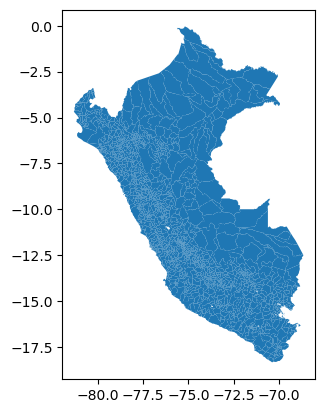

In [117]:
dist_shp.plot()

In [118]:
prov_shp = dist_shp.dissolve( by = 'IDPROV' )

<Axes: >

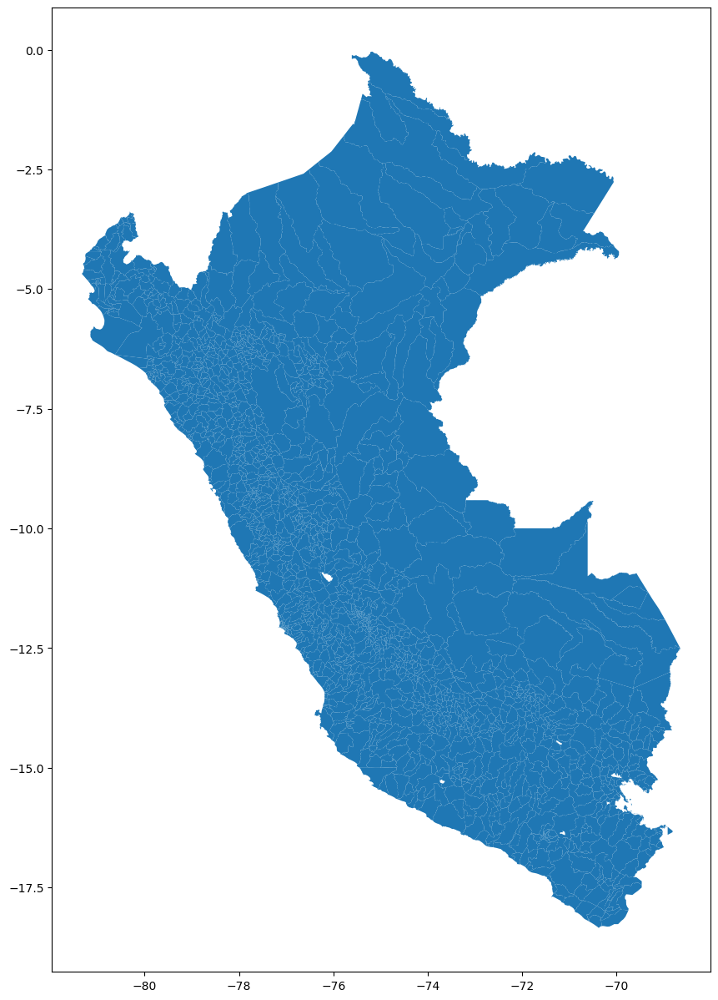

In [119]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
dist_shp.plot( ax = ax )

<Axes: >

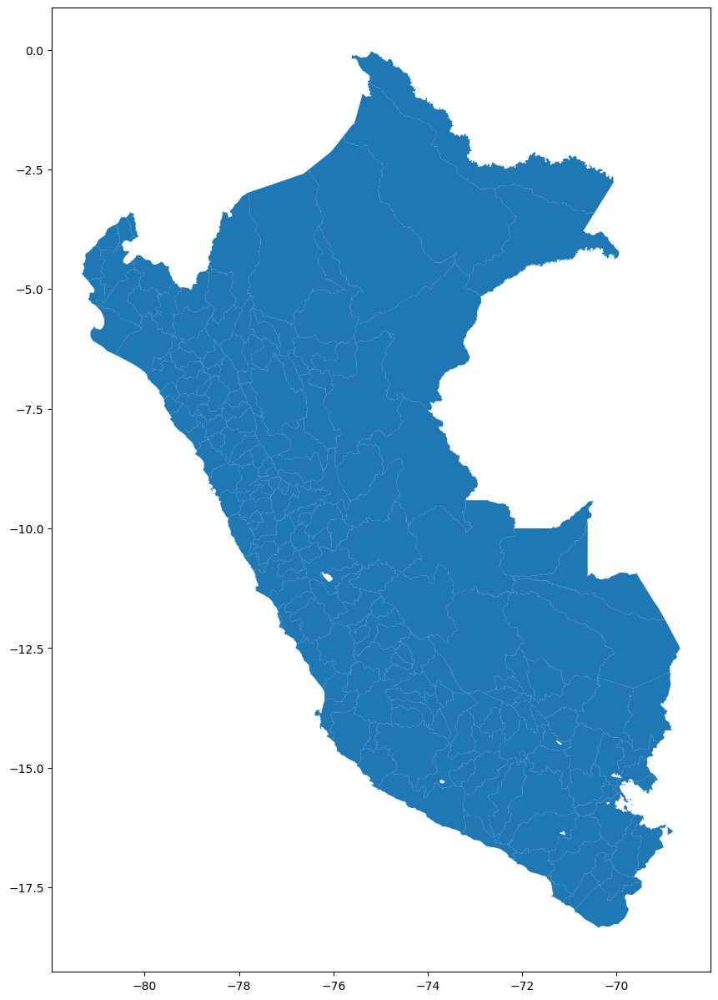

In [120]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
prov_shp.plot( ax = ax )

In [121]:
dpt_shp = dist_shp.dissolve( by = 'IDDPTO' )

<Axes: >

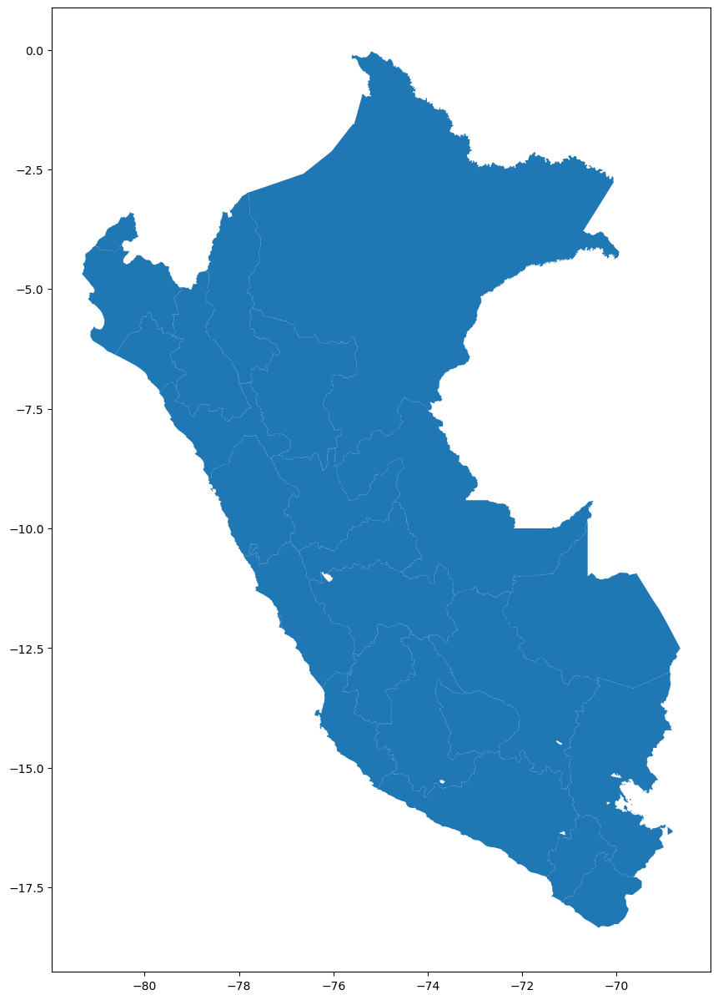

In [122]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
dpt_shp.plot( ax = ax )

<Axes: >

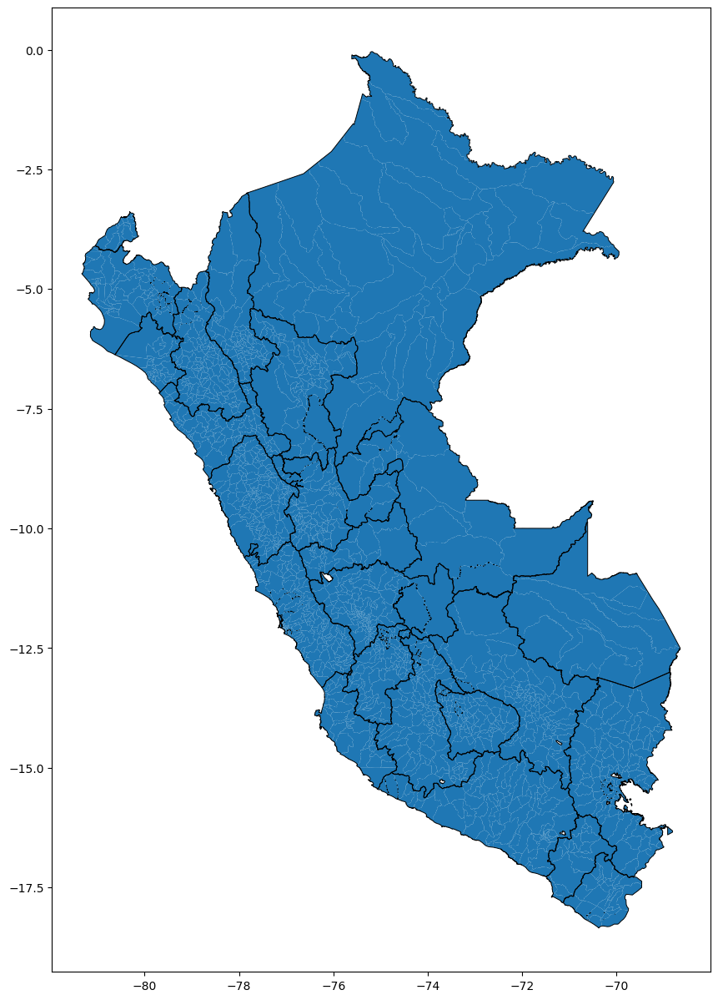

In [123]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
dist_shp.plot( ax = ax )
dpt_shp.plot( ax = ax, facecolor="none",  edgecolor='black', lw=0.7 )

## Checking CRS

In [124]:
# Border of Switzerland
ch_borders = gpd.read_file( r'../_data/eu_maps/CHE_adm0.shp')

# Border of Germany
de_borders = gpd.read_file( r'../_data/eu_maps/gadm36_DEU_0.shp')

# Switzerland lakes shape files
ch_lakes = gpd.GeoDataFrame.from_file( r'../_data/eu_maps/g2s15.shp')

# muni
Geo_muni = gpd.read_file( r"../_data/eu_maps/VG250_GEM.shp" )

Plots with different CRS

(np.float64(-46058.36469219931),
 np.float64(967356.691928138),
 np.float64(-305024.0777151486),
 np.float64(6406513.607306512))

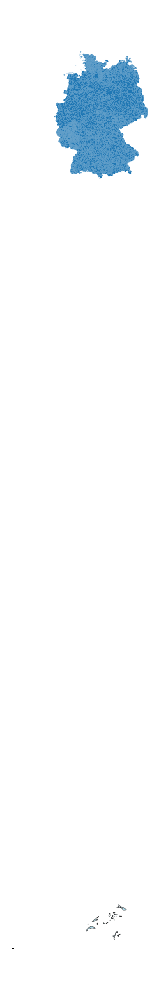

In [125]:

fig = plt.figure(figsize=(40, 20), dpi=100)
ax = fig.add_subplot(111, frame_on = False )

# German Plot
Geo_muni.plot( ax = ax )

# switzerland borders
ch_borders.geometry.boundary.plot(color = 'black', ax=ax, edgecolor='0.2', linewidth=1.5) 

# # Swiss lakes
ch_lakes.plot(color='lightblue' , ax=ax, edgecolor='0.2', linewidth=0.4, legend=True)

ax.axis('off')

# # define coordinates for the plot area
# ax.set_xlim(455869.5728, 927076.5648)
# #ax.set_ylim( auto = True)
# ax.set_ylim(60443.1884, 529941.7864)

# Save in pdf
# plt.savefig('maps/inventors_BW_bar_legend.pdf')


Check CRS

In [126]:
shp_files = [ ch_borders, de_borders, ch_lakes, Geo_muni ]

In [127]:
for shp in shp_files:
    print( shp.crs )
    
#cada informacion esta por su CRS, debe cambiarse

EPSG:4326
EPSG:4326
EPSG:21781
EPSG:25832


Reproject CRS

In [128]:
Geo_muni_crs = Geo_muni.to_crs( 21781 )

In [129]:
ch_borders_crs = ch_borders.to_crs( 21781 )

(np.float64(453126.0049465788),
 np.float64(1163640.4776774019),
 np.float64(11798.918320549856),
 np.float64(1157415.4734684501))

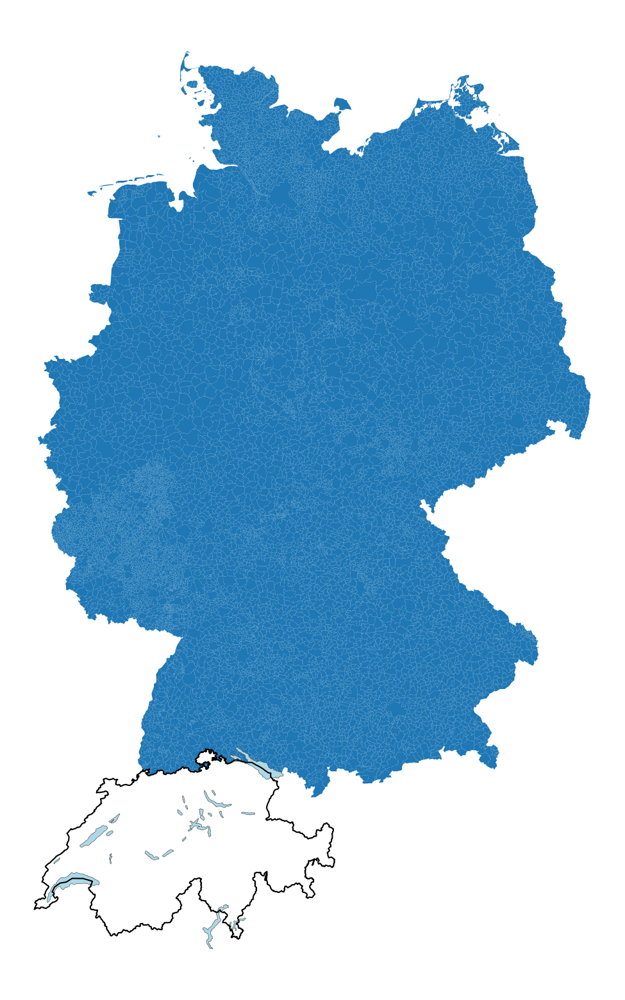

In [130]:

fig = plt.figure(figsize=(40, 20), dpi=100)
ax = fig.add_subplot(111, frame_on = False )

# German Plot
Geo_muni_crs.plot( ax = ax )

# switzerland borders
ch_borders_crs.geometry.boundary.plot(color = 'black', ax=ax, edgecolor='0.2', linewidth=1.5) 

# # Swiss lakes
ch_lakes.plot(color='lightblue' , ax=ax, edgecolor='0.2', linewidth=0.4, legend=True)

ax.axis('off')

# # define coordinates for the plot area
# ax.set_xlim(455869.5728, 927076.5648)
#ax.set_ylim( auto = True)
# ax.set_ylim(60443.1884, 529941.7864)

# Save in pdf
# plt.savefig('maps/inventors_BW_bar_legend.pdf')


## References:


### Geopandas
https://geopandas.org/en/stable/docs/user_guide/set_operations.html

https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html

https://geopandas.org/en/stable/docs/user_guide/data_structures.html

https://www.kaggle.com/imdevskp/geopandas

### Coordinate Reference System

https://geopandas.org/en/stable/docs/user_guide/projections.html

#### Types of projections

https://spatialreference.org/

#### Universal Transverse Mercator (UTM)

https://manifold.net/doc/mfd9/universal_transverse_mercator_projection.htm

